In [34]:
import sqlite3
from sqlite3 import Error
from sqlite3 import IntegrityError
from ipyfilechooser import FileChooser
import matplotlib.pyplot as plt
import pandas as pd
import io
import requests
import numpy as np
import seaborn as sns
from scipy import stats
import math
from scipy.stats import ttest_ind
from tqdm import tqdm

## Clustering Playtest

The below cells are for exploring clustering functionalities. Currently under development.

In [35]:
conn = sqlite3.connect('/Users/lavanya/Desktop/Lavanya_Test/data_updated.db')
tables_query = "SELECT name FROM sqlite_master WHERE type='table';"
tables = pd.read_sql_query(tables_query, conn)['name'].tolist()
tstat_gene = pd.read_sql_query(f"SELECT * FROM tstat_gene_data", conn)
conn.close()

In [36]:
def aggregate_unique_values(df ,by):
    """Aggregate and transform tstat_gene_data table"""
    grouped = df.groupby(by).agg(
        {col: 'mean' for col in df.columns if col not in by+ ['Screen']}).reset_index()

    # Aggregate the Screen column into a list
    grouped['Screen'] = df.groupby(by)['Screen'].apply(lambda x: list(set(x))).reset_index(drop=True)

    return grouped

In [37]:
tstat_gene=aggregate_unique_values(tstat_gene, ["Gene"]).explode('Screen').reset_index(drop=True)

In [38]:
tstat_gene.head(10)

,Gene,Morphwidth,Midline,Area,Instantaneous Speed,Interval Speed,Angular Speed,Bias,Aspect Ratio,Kink,...,Habituation of Response Duration,Habituation of Respones Probability,Habituation of Response Speed,Spontaneous Recovery of Response Duration,Spontaneous Recovery of Response Probability,Spontaneous Recovery of Response Speed,Memory Retention of Response Duration,Memory Retention of Response Probability,Memory Retention of Response Speed,Screen
0,C03A3.3,-0.220529,-0.342169,-0.291090,-0.667765,-0.322348,-0.271932,-1.129215,0.639744,0.910946,...,-0.242102,-2.154349,-1.126580,NaN,NaN,NaN,NaN,NaN,NaN,Neuron_Genes_Screen
1,C03B1.5,-0.016406,-0.087413,-0.043405,0.027614,0.288099,-0.034809,-0.150583,0.376741,0.228663,...,0.729022,-1.275032,-0.255510,NaN,NaN,NaN,NaN,NaN,NaN,Neuron_Genes_Screen
2,C04B4.2,-1.028247,-1.810206,-1.703882,-2.806937,-1.229005,-1.640433,-3.434870,1.051706,1.492904,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Neuron_Genes_Screen
3,C04E6.5,-1.103752,-0.632607,-0.891474,-0.779249,-0.305898,-0.571540,-0.868274,0.771762,1.051677,...,4.647681,-6.241596,-0.129734,NaN,NaN,NaN,NaN,NaN,NaN,Neuron_Genes_Screen
4,C25H3.11,-1.556156,-0.764493,-1.539187,0.275303,0.387197,0.416485,0.076761,-0.307495,-0.140687,...,-0.061026,0.277092,-0.660458,1.092961,0.141980,2.201448,0.971439,0.696406,0.821123,ASD_Screen
5,C27B7.7,-2.956793,-2.855183,-3.236610,-0.569822,0.093324,1.124185,-0.992455,1.731379,1.539844,...,-0.902554,0.262964,-1.132887,NaN,NaN,NaN,NaN,NaN,NaN,Neuron_Genes_Screen
6,C29E4.10,-0.640408,-0.176441,-0.403961,0.915419,0.931846,1.240604,1.035898,-0.245481,-0.567404,...,0.050655,-1.014767,1.063643,-1.357953,-0.105083,-0.579105,-0.309472,-1.296940,0.997838,PD_Screen
7,C44H4.6,-0.400718,-1.607455,-0.950006,-1.105688,-1.031454,-0.018041,-1.856455,2.085765,2.017347,...,-0.244327,-0.745122,-1.487834,NaN,NaN,NaN,NaN,NaN,NaN,Neuron_Genes_Screen
8,C49C3.21,-1.628656,-0.428037,-0.811281,0.869303,0.423283,1.511938,1.145092,0.837098,0.548072,...,0.534280,-1.421223,-0.374967,NaN,NaN,NaN,NaN,NaN,NaN,Neuron_Genes_Screen
9,D1081.4,-0.973873,-1.574691,-1.826739,-1.424744,-0.812917,-0.361217,-2.037865,2.472372,2.474205,...,0.294672,-1.647760,-1.387516,NaN,NaN,NaN,NaN,NaN,NaN,Neuron_Genes_Screen


In [39]:
data = tstat_gene.drop(tstat_gene[tstat_gene.Gene == "N2"].index)
data = data.drop(columns=['Spontaneous Recovery of Response Duration',
                          'Spontaneous Recovery of Response Probability',
                          'Spontaneous Recovery of Response Speed',
                          'Memory Retention of Response Duration',
                          'Memory Retention of Response Probability',
                          'Memory Retention of Response Speed'])
data_na = data.dropna().reset_index().drop(columns=['index'])
data_na


,Gene,Morphwidth,Midline,Area,Instantaneous Speed,Interval Speed,Angular Speed,Bias,Aspect Ratio,Kink,...,Initial Response Duration,Initial Response Probability,Initial Response Speed,Final Response Duration,Final Response Probability,Final Response Speed,Habituation of Response Duration,Habituation of Respones Probability,Habituation of Response Speed,Screen
0,C03A3.3,-0.220529,-0.342169,-0.291090,-0.667765,-0.322348,-0.271932,-1.129215,0.639744,0.910946,...,0.067980,0.312295,-0.257993,1.788590,2.100269,0.428537,-0.242102,-2.154349,-1.126580,Neuron_Genes_Screen
1,C03B1.5,-0.016406,-0.087413,-0.043405,0.027614,0.288099,-0.034809,-0.150583,0.376741,0.228663,...,1.009267,0.295878,0.442248,1.074174,1.332653,0.921348,0.729022,-1.275032,-0.255510,Neuron_Genes_Screen
2,C04E6.5,-1.103752,-0.632607,-0.891474,-0.779249,-0.305898,-0.571540,-0.868274,0.771762,1.051677,...,7.560540,0.496969,0.624921,0.682258,4.057593,1.140472,4.647681,-6.241596,-0.129734,Neuron_Genes_Screen
3,C25H3.11,-1.556156,-0.764493,-1.539187,0.275303,0.387197,0.416485,0.076761,-0.307495,-0.140687,...,-0.059835,0.085660,-0.230938,-0.047066,-0.369334,0.713288,-0.061026,0.277092,-0.660458,ASD_Screen
4,C27B7.7,-2.956793,-2.855183,-3.236610,-0.569822,0.093324,1.124185,-0.992455,1.731379,1.539844,...,-0.658466,-0.654237,-0.450359,0.759215,-1.371399,0.953389,-0.902554,0.262964,-1.132887,Neuron_Genes_Screen
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
638,zig-12,-0.097164,0.067767,-0.005527,-0.532882,-0.294227,-0.688384,-0.984545,0.377725,0.665257,...,0.754193,-0.058995,0.023849,1.057102,-0.125484,1.091059,0.012386,0.140701,-1.319500,Neuron_Genes_Screen
639,zig-12,-0.097164,0.067767,-0.005527,-0.532882,-0.294227,-0.688384,-0.984545,0.377725,0.665257,...,0.754193,-0.058995,0.023849,1.057102,-0.125484,1.091059,0.012386,0.140701,-1.319500,G-Proteins_Screen
640,zig-3,-3.414393,-2.752945,-3.526759,-1.313952,-1.268954,0.950489,-0.726927,3.092086,2.128625,...,1.086532,0.091952,-0.504754,0.821308,1.265044,0.187663,0.138806,-1.253214,-0.687703,Neuron_Genes_Screen
641,zig-7,0.917983,0.161612,0.483594,-0.905476,-0.543840,-0.539797,-1.272392,1.735829,1.454407,...,1.385297,0.210650,-0.212235,0.564364,0.180011,-0.338205,1.285455,-0.059817,-0.101041,Neuron_Genes_Screen


### Standardizing the numerical data to get unbiased results

In [40]:
from sklearn.preprocessing import StandardScaler

features = data_na.columns.drop(['Gene', 'Screen'])
labels = data_na['Screen']
scaler = StandardScaler()
data_na[features] = scaler.fit_transform(data_na[features])

In [41]:
data_na

,Gene,Morphwidth,Midline,Area,Instantaneous Speed,Interval Speed,Angular Speed,Bias,Aspect Ratio,Kink,...,Initial Response Duration,Initial Response Probability,Initial Response Speed,Final Response Duration,Final Response Probability,Final Response Speed,Habituation of Response Duration,Habituation of Respones Probability,Habituation of Response Speed,Screen
0,C03A3.3,0.600520,0.698378,0.689236,0.297415,0.459934,-0.124341,-0.027745,-0.323477,-0.094341,...,-0.483548,0.481811,0.256648,1.106224,1.596610,0.347276,-0.582925,-1.360310,-0.385825,Neuron_Genes_Screen
1,C03B1.5,0.803786,0.953541,0.936695,0.885098,1.034217,0.102576,0.743105,-0.549186,-0.659226,...,0.419026,0.465919,0.966595,0.458910,0.845996,0.824707,0.381544,-0.477481,0.438581,Neuron_Genes_Screen
2,C04E6.5,-0.278998,0.407477,0.089397,0.203197,0.475409,-0.411052,0.177793,-0.210180,0.022175,...,6.700857,0.660578,1.151800,0.103806,3.510580,1.036992,4.273349,-5.463881,0.557619,Neuron_Genes_Screen
3,C25H3.11,-0.729504,0.275380,-0.557726,1.094427,1.127444,0.534443,0.922180,-1.136395,-0.965023,...,-0.606106,0.262426,0.284078,-0.557016,-0.818293,0.623140,-0.403090,1.080842,0.055327,ASD_Screen
4,C27B7.7,-2.124266,-1.818648,-2.253607,0.380190,0.850980,1.211679,0.079978,0.613359,0.426345,...,-1.180116,-0.453801,0.061616,0.173534,-1.798163,0.855748,-1.238851,1.066658,-0.391795,Neuron_Genes_Screen
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
638,zig-12,0.723367,1.108969,0.974539,0.411408,0.486388,-0.522866,0.086209,-0.548341,-0.297755,...,0.174443,0.122398,0.542396,0.443443,-0.579844,0.989121,-0.330181,0.943907,-0.568410,Neuron_Genes_Screen
639,zig-12,0.723367,1.108969,0.974539,0.411408,0.486388,-0.522866,0.086209,-0.548341,-0.297755,...,0.174443,0.122398,0.542396,0.443443,-0.579844,0.989121,-0.330181,0.943907,-0.568410,G-Proteins_Screen
640,zig-3,-2.579947,-1.716246,-2.543492,-0.248695,-0.430594,1.045460,0.289129,1.781113,0.913817,...,0.493113,0.268517,0.006466,0.229795,0.779884,0.113920,-0.204627,-0.455576,0.029541,Neuron_Genes_Screen
641,zig-7,1.734256,1.202963,1.463215,0.096519,0.251563,-0.380675,-0.140523,0.617178,0.355609,...,0.779591,0.383417,0.303040,-0.003014,-0.281116,-0.395536,0.934163,0.742587,0.584775,Neuron_Genes_Screen


## EDA
#### Correlation Plot for entire database

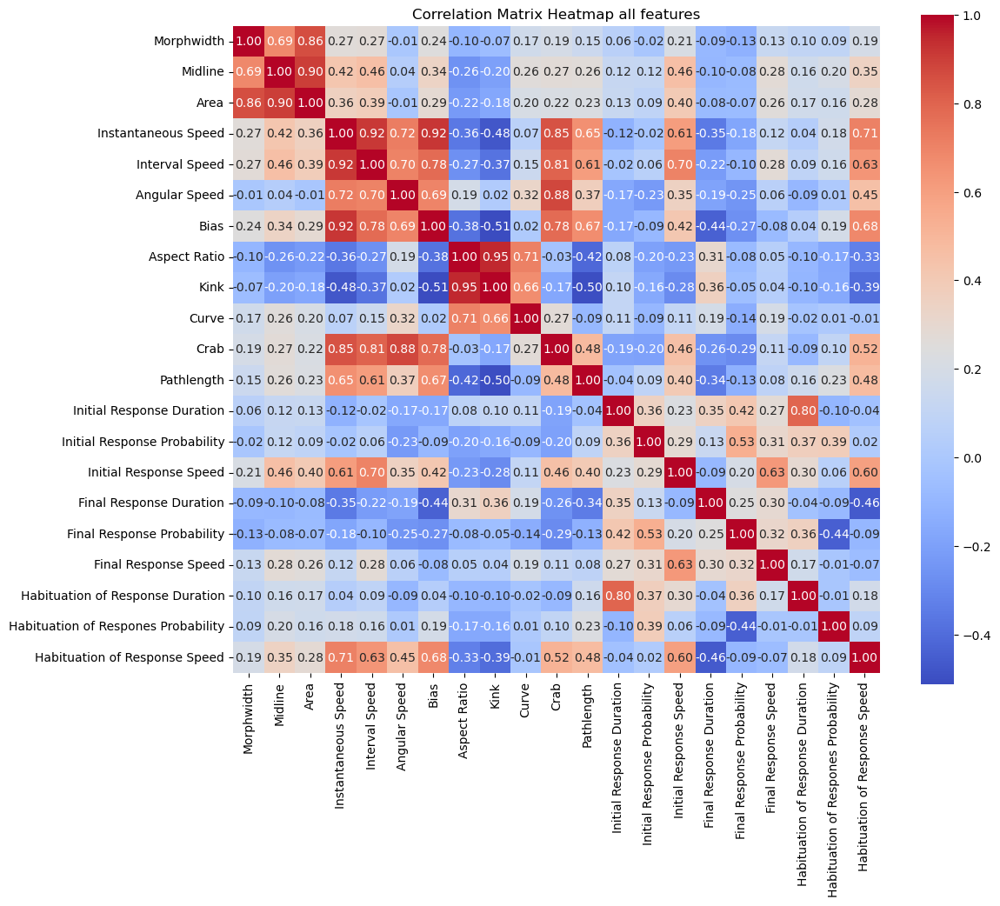

In [42]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate correlation matrix
correlation_matrix = data_na.drop(columns=['Gene', 'Screen']).corr() ## all features included
# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation Matrix Heatmap all features')
plt.show()


We look for pairs of features with high correlations (e.g., > 0.8 or < -0.8), which might indicate multicollinearity.

we notice with all features included:
- Morphwidth - Area
- Midline - Area
- Instantaneous Speed - Interval Speed
- Instantaneous Speed - Bias
- Instantaneous Speed - Crab
- Interval Speed - Crab
- Angular Speed - Crab
- Aspect Ratio - Kink
- Initial Response duration- Habituation of Response duration


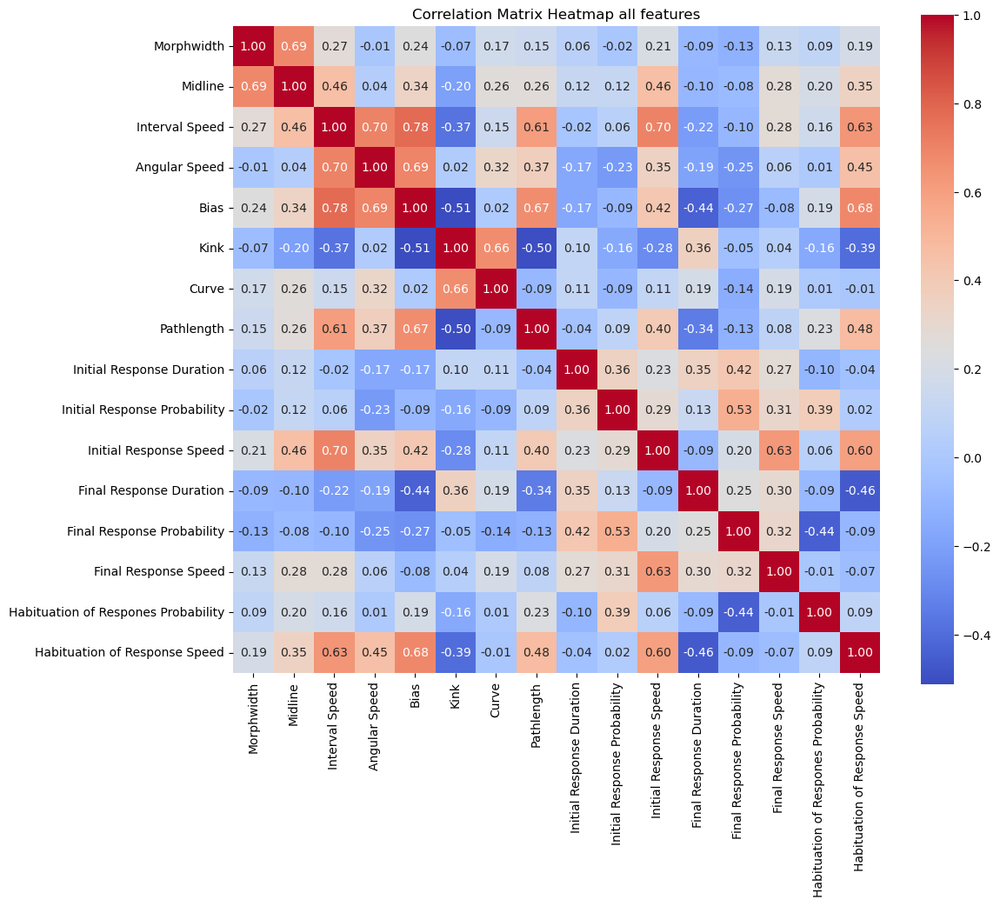

In [43]:
drop_columns=['Instantaneous Speed','Area', 'Aspect Ratio', 'Crab', 'Habituation of Response Duration']
# Calculate correlation matrix with fewer cfeatures
correlation_matrix = data_na.drop(columns=['Gene', 'Screen']+drop_columns).corr()
# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation Matrix Heatmap all features')
plt.show()


after removing Area, Instantaneous Speed, Aspect ratio, Crab, Habituation of Response duration we notice correlation is less when compared to the standard 0.8 value


## Correlation matrix for specific genes


### PD_Screen

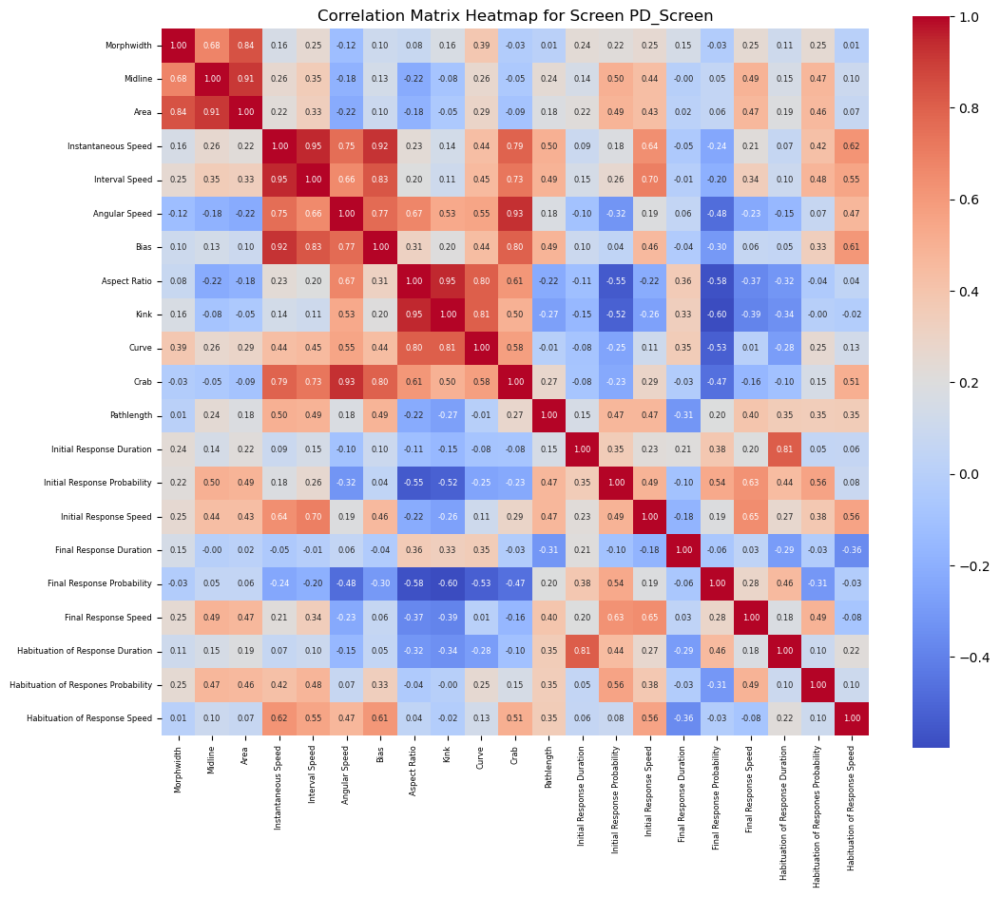

Features with correlation greater than 0.8 or less than -0.8 for Screen PD_Screen
Area - Morphwidth: 0.8422596482301787
Area - Midline: 0.9115874360647425
Interval Speed - Instantaneous Speed: 0.9461183190155033
Bias - Instantaneous Speed: 0.923757922214067
Bias - Interval Speed: 0.8269355845475671
Kink - Aspect Ratio: 0.9482841799795277
Curve - Aspect Ratio: 0.8004600399227445
Curve - Kink: 0.8058269350193695
Crab - Angular Speed: 0.9286290494219773
Habituation of Response Duration - Initial Response Duration: 0.8101045341385855


In [44]:
PD_data = data_na[data_na['Screen'] == 'PD_Screen']
    
# Calculate correlation matrix for this screen
correlation_matrix = PD_data.drop(columns=['Gene', 'Screen']).corr()

# Plot heatmap for this screen
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, annot_kws={'fontsize': 6})
plt.title('Correlation Matrix Heatmap for Screen PD_Screen')
plt.xticks(fontsize=6)  # <--- Adjust font size here
plt.yticks(fontsize=6)
plt.show()

# Print features with correlation greater than 0.8 or less than -0.8
print('Features with correlation greater than 0.8 or less than -0.8 for Screen PD_Screen')
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            print(f'{correlation_matrix.columns[i]} - {correlation_matrix.columns[j]}: {correlation_matrix.iloc[i, j]}')

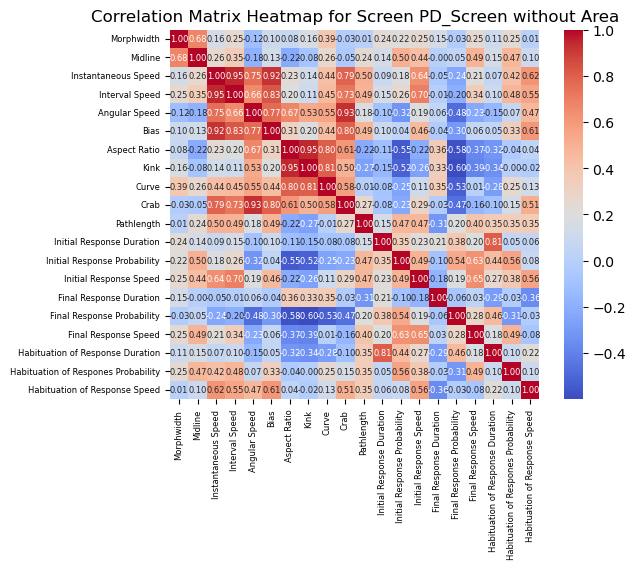

Features with correlation greater than 0.8 or less than -0.8 for Screen PD_Screen
Interval Speed - Instantaneous Speed: 0.9461183190155033
Bias - Instantaneous Speed: 0.923757922214067
Bias - Interval Speed: 0.8269355845475671
Kink - Aspect Ratio: 0.9482841799795277
Curve - Aspect Ratio: 0.8004600399227445
Curve - Kink: 0.8058269350193695
Crab - Angular Speed: 0.9286290494219773
Habituation of Response Duration - Initial Response Duration: 0.8101045341385855


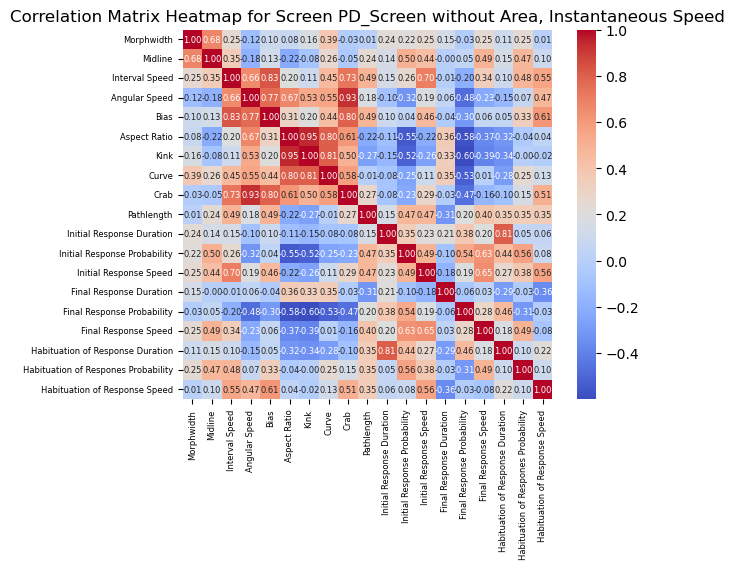

Features with correlation greater than 0.8 or less than -0.8 for Screen PD_Screen
Bias - Interval Speed: 0.8269355845475671
Kink - Aspect Ratio: 0.9482841799795277
Curve - Aspect Ratio: 0.8004600399227445
Curve - Kink: 0.8058269350193695
Crab - Angular Speed: 0.9286290494219773
Habituation of Response Duration - Initial Response Duration: 0.8101045341385855


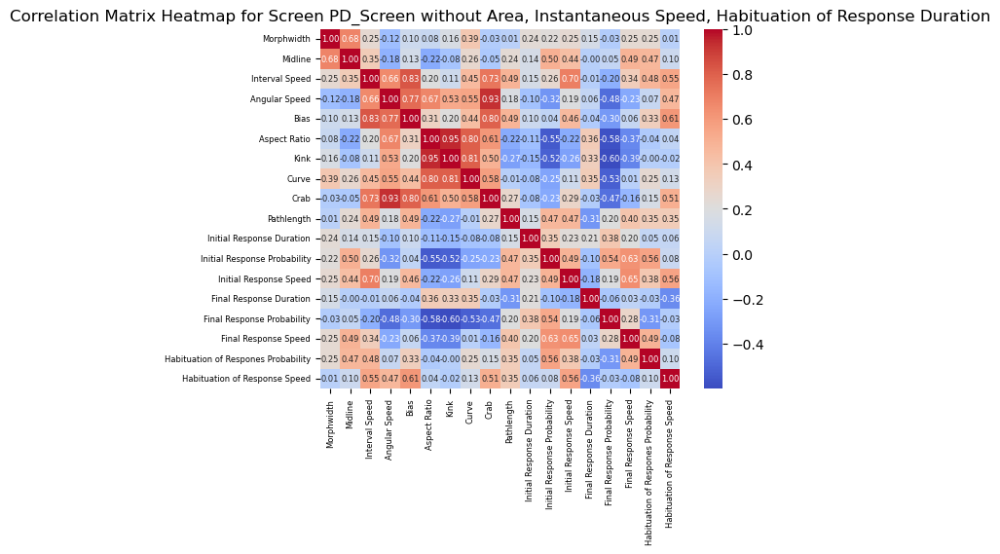

Features with correlation greater than 0.8 or less than -0.8 for Screen PD_Screen
Bias - Interval Speed: 0.8269355845475671
Kink - Aspect Ratio: 0.9482841799795277
Curve - Aspect Ratio: 0.8004600399227445
Curve - Kink: 0.8058269350193695
Crab - Angular Speed: 0.9286290494219773


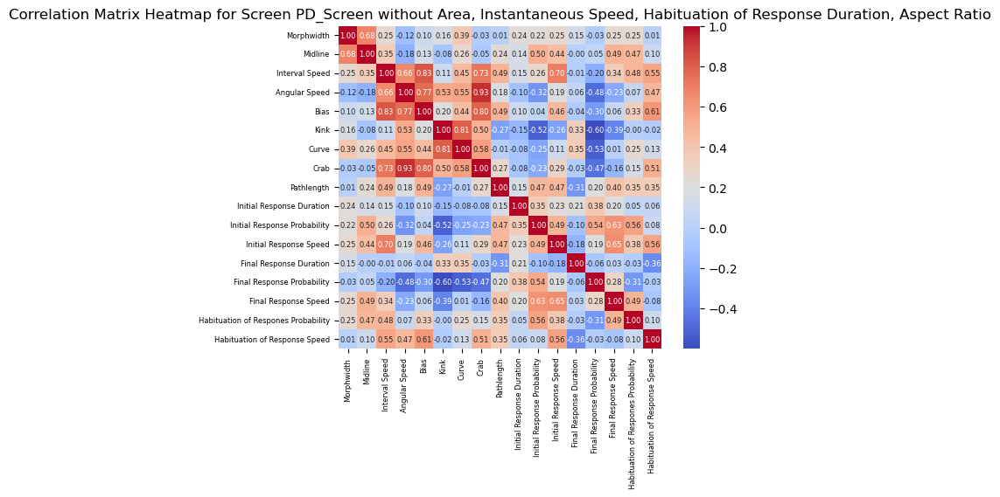

Features with correlation greater than 0.8 or less than -0.8 for Screen PD_Screen
Bias - Interval Speed: 0.8269355845475671
Curve - Kink: 0.8058269350193695
Crab - Angular Speed: 0.9286290494219773


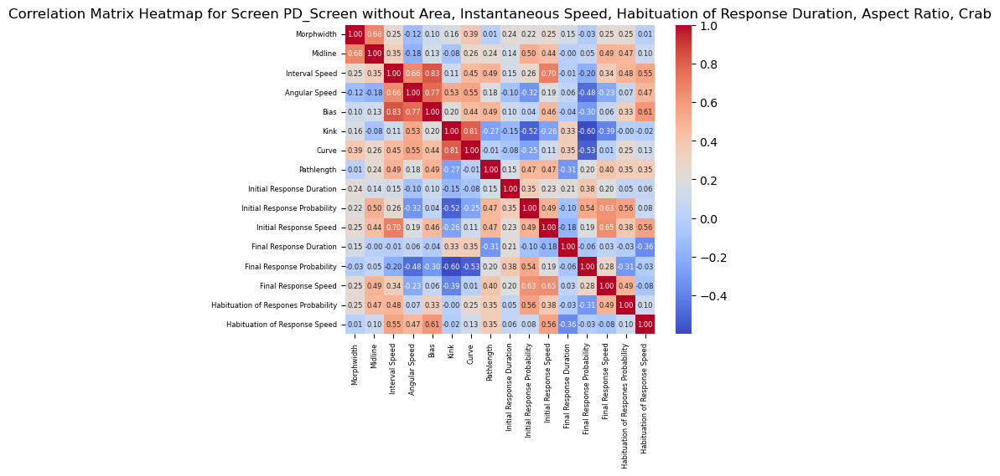

Features with correlation greater than 0.8 or less than -0.8 for Screen PD_Screen
Bias - Interval Speed: 0.8269355845475671
Curve - Kink: 0.8058269350193695


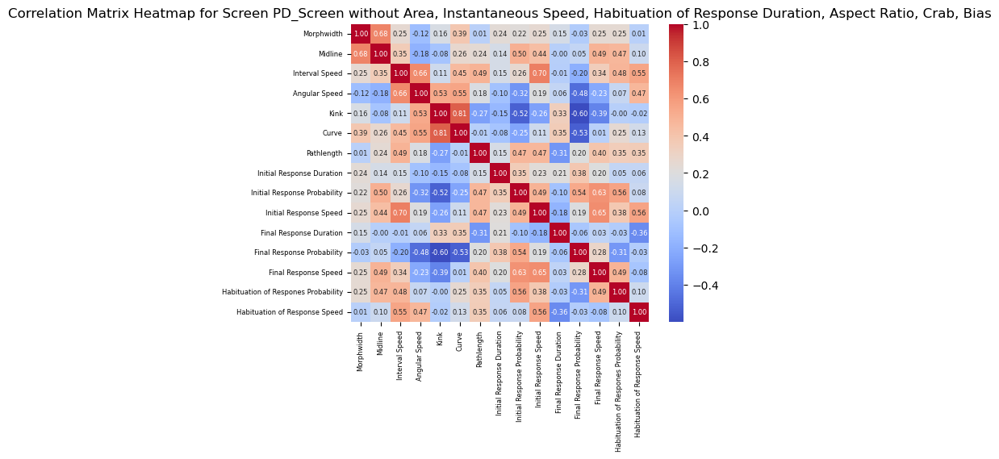

Features with correlation greater than 0.8 or less than -0.8 for Screen PD_Screen
Curve - Kink: 0.8058269350193695


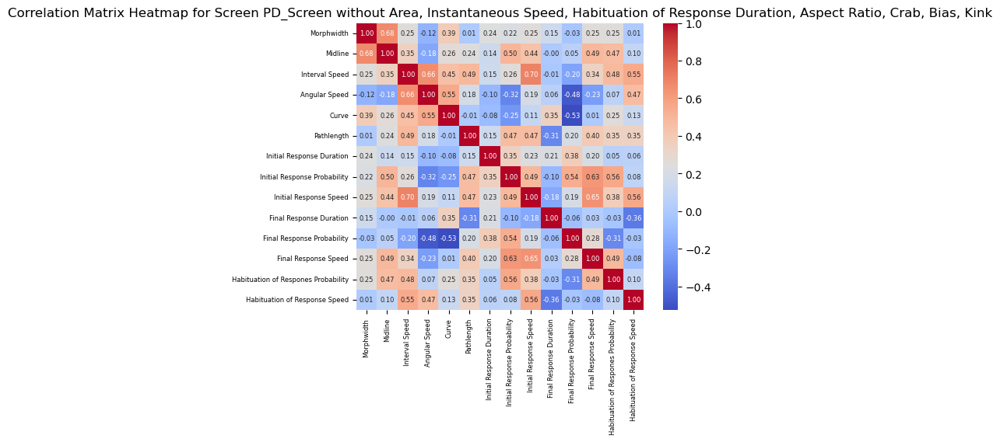

Features with correlation greater than 0.8 or less than -0.8 for Screen PD_Screen


In [45]:
drop_columns_PD=['Area','Instantaneous Speed','Habituation of Response Duration', 'Aspect Ratio', 'Crab', 'Bias', 'Kink']
drop_columns_PD = []

for col in ['Area', 'Instantaneous Speed', 'Habituation of Response Duration', 'Aspect Ratio', 'Crab', 'Bias', 'Kink']:
    drop_columns_PD.append(col)

    # Calculate correlation matrix for this screen
    correlation_matrix = PD_data.drop(columns=['Gene', 'Screen']+drop_columns_PD).corr()

    # Plot heatmap for this screen
    # plt.figure(figsize=(12, 10))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True,annot_kws={'fontsize': 6})
    plt.title(f'Correlation Matrix Heatmap for Screen PD_Screen without {", ".join(drop_columns_PD)}')    
    plt.xticks(fontsize=6)  # <--- Adjust font size here
    plt.yticks(fontsize=6)
    plt.show()

    # Print features with correlation greater than 0.8 or less than -0.8
    print('Features with correlation greater than 0.8 or less than -0.8 for Screen PD_Screen')
    for i in range(len(correlation_matrix.columns)):
        for j in range(i):
            if abs(correlation_matrix.iloc[i, j]) > 0.8:
                print(f'{correlation_matrix.columns[i]} - {correlation_matrix.columns[j]}: {correlation_matrix.iloc[i, j]}')


### ASD_Screen

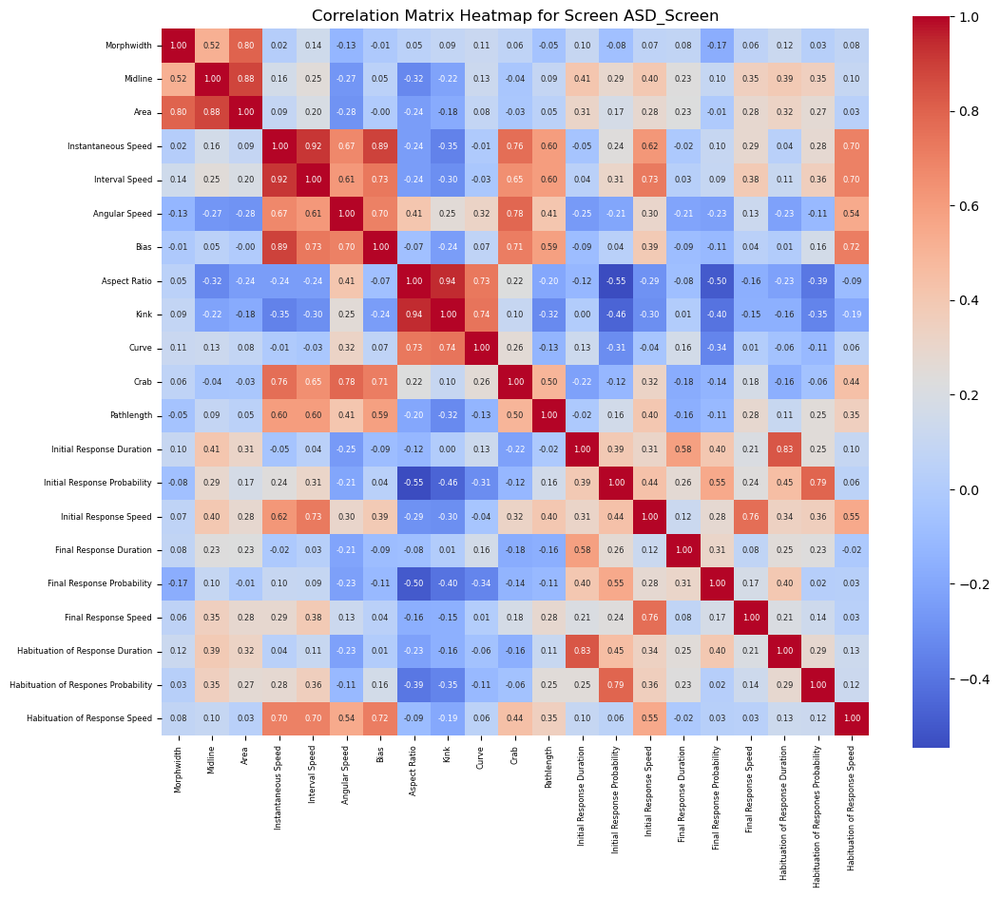

Features with correlation greater than 0.8 or less than -0.8 for Screen ASD_Screen
Area - Midline: 0.8794023705459915
Interval Speed - Instantaneous Speed: 0.9167289463147733
Bias - Instantaneous Speed: 0.8890915864683537
Kink - Aspect Ratio: 0.9400755253868467
Habituation of Response Duration - Initial Response Duration: 0.8330016999411459


In [46]:
ASD_data = data_na[data_na['Screen'] == 'ASD_Screen']
    
# Calculate correlation matrix for this screen
correlation_matrix = ASD_data.drop(columns=['Gene', 'Screen']).corr()

# Plot heatmap for this screen
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, annot_kws={'fontsize': 6})
plt.title('Correlation Matrix Heatmap for Screen ASD_Screen')
plt.xticks(fontsize=6)  # <--- Adjust font size here
plt.yticks(fontsize=6)
plt.show()

# Print features with correlation greater than 0.8 or less than -0.8
print('Features with correlation greater than 0.8 or less than -0.8 for Screen ASD_Screen')
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            print(f'{correlation_matrix.columns[i]} - {correlation_matrix.columns[j]}: {correlation_matrix.iloc[i, j]}')

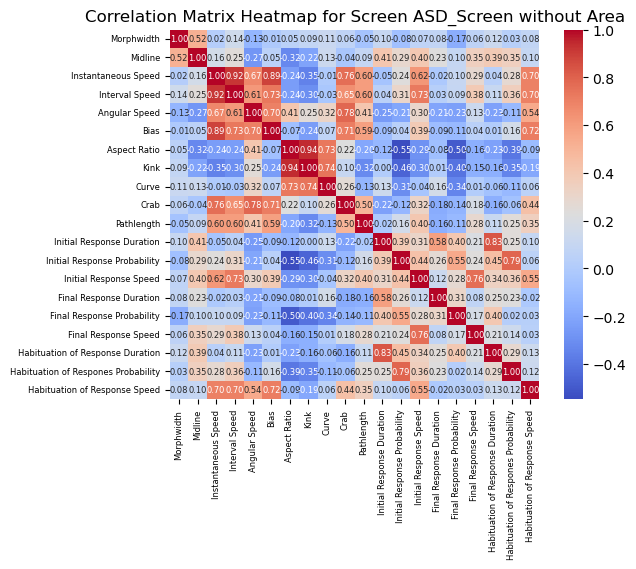

Features with correlation greater than 0.8 or less than -0.8 for Screen ASD_Screen
Interval Speed - Instantaneous Speed: 0.9167289463147733
Bias - Instantaneous Speed: 0.8890915864683537
Kink - Aspect Ratio: 0.9400755253868467
Habituation of Response Duration - Initial Response Duration: 0.8330016999411459


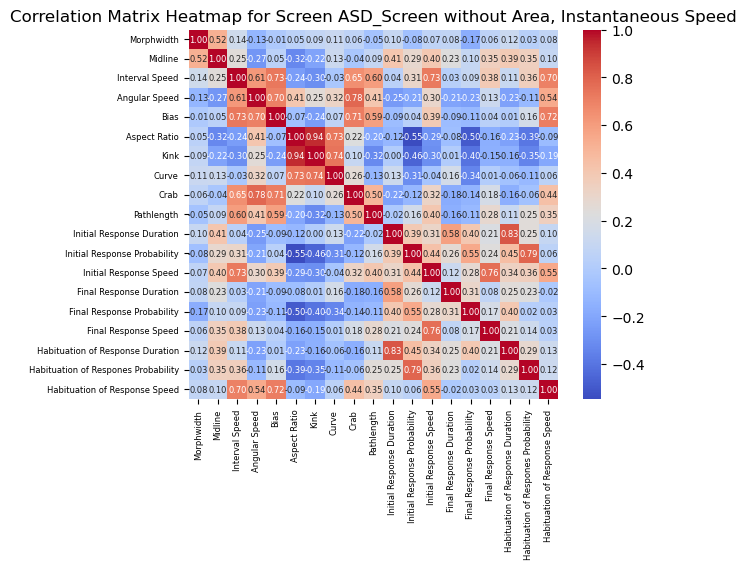

Features with correlation greater than 0.8 or less than -0.8 for Screen ASD_Screen
Kink - Aspect Ratio: 0.9400755253868467
Habituation of Response Duration - Initial Response Duration: 0.8330016999411459


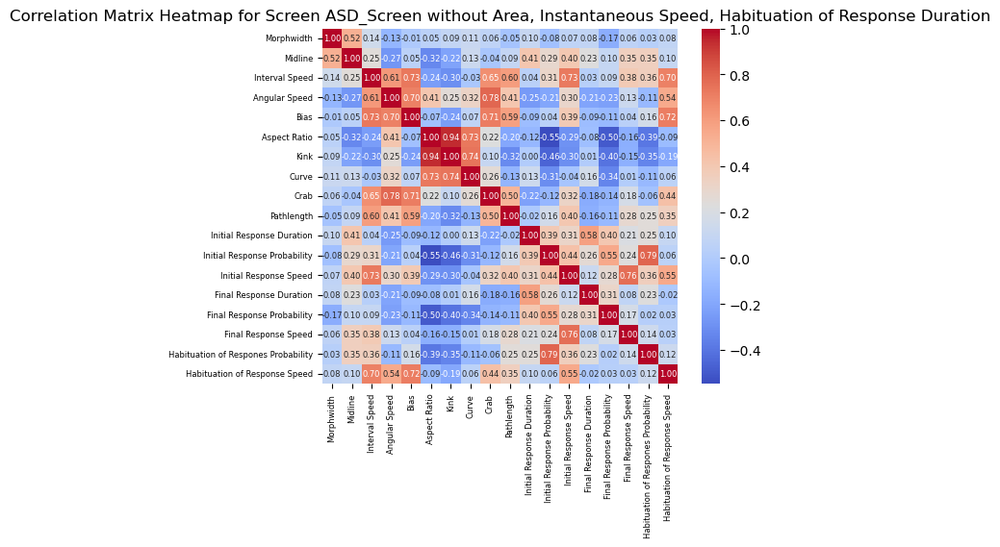

Features with correlation greater than 0.8 or less than -0.8 for Screen ASD_Screen
Kink - Aspect Ratio: 0.9400755253868467


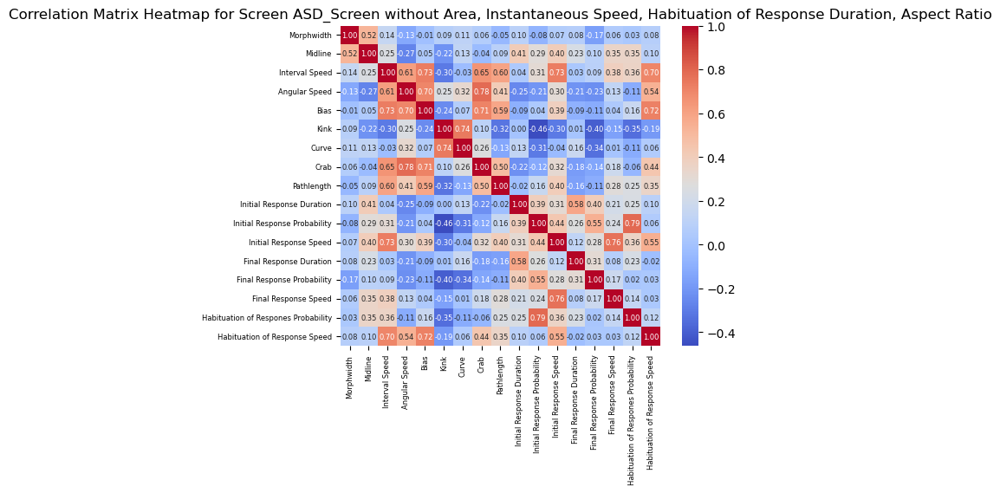

Features with correlation greater than 0.8 or less than -0.8 for Screen ASD_Screen


In [47]:
drop_columns_ASD=['Area','Instantaneous Speed','Habituation of Response Duration', 'Aspect Ratio']
drop_columns_ASD = []

for col in ['Area', 'Instantaneous Speed', 'Habituation of Response Duration', 'Aspect Ratio']:
    drop_columns_ASD.append(col)

    # Calculate correlation matrix for this screen
    correlation_matrix = ASD_data.drop(columns=['Gene', 'Screen']+drop_columns_ASD).corr()

    # Plot heatmap for this screen
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True,annot_kws={'fontsize': 6})
    plt.title(f'Correlation Matrix Heatmap for Screen ASD_Screen without {", ".join(drop_columns_ASD)}')    
    plt.xticks(fontsize=6)  # <--- Adjust font size here
    plt.yticks(fontsize=6)
    plt.show()

    # Print features with correlation greater than 0.8 or less than -0.8
    print('Features with correlation greater than 0.8 or less than -0.8 for Screen ASD_Screen')
    for i in range(len(correlation_matrix.columns)):
        for j in range(i):
            if abs(correlation_matrix.iloc[i, j]) > 0.8:
                print(f'{correlation_matrix.columns[i]} - {correlation_matrix.columns[j]}: {correlation_matrix.iloc[i, j]}')


### Glia_Genes_Screen

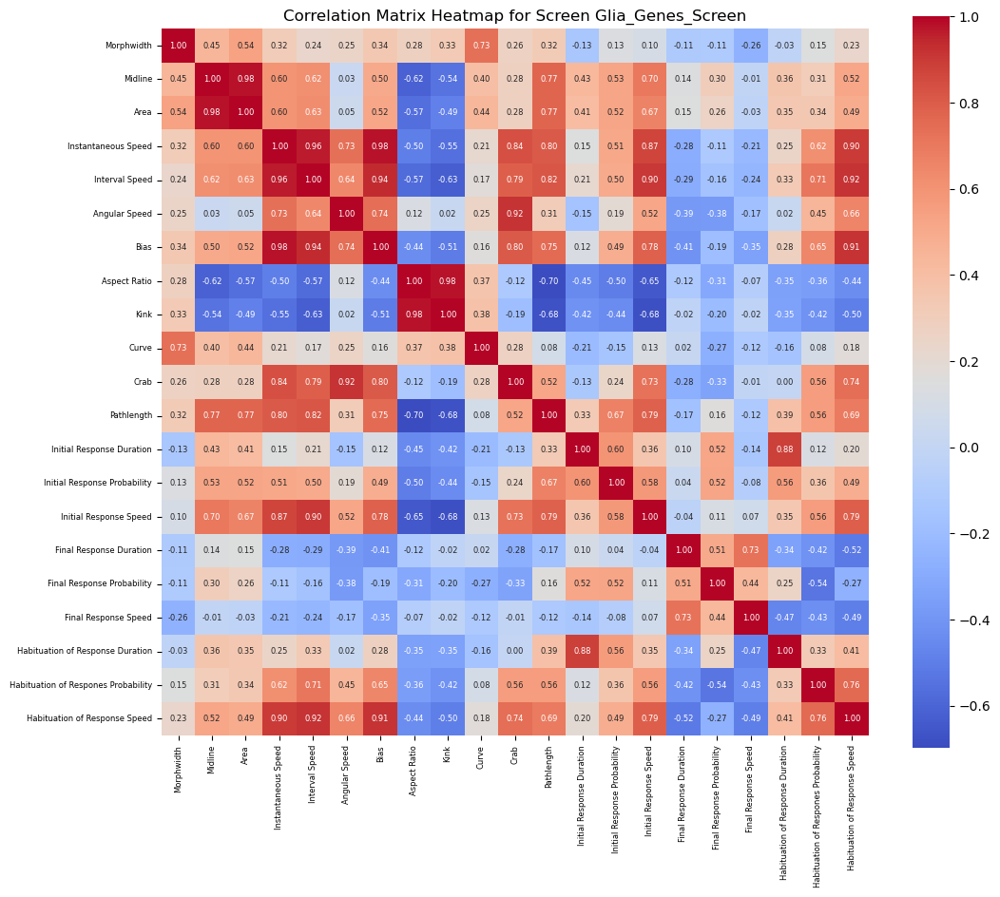

Features with correlation greater than 0.8 or less than -0.8 for Screen Glia_Genes_Screen
Area - Midline: 0.9788856350242257
Interval Speed - Instantaneous Speed: 0.9624148813893294
Bias - Instantaneous Speed: 0.9765902088983791
Bias - Interval Speed: 0.9355889948155837
Kink - Aspect Ratio: 0.9796879871644052
Crab - Instantaneous Speed: 0.8386216979020015
Crab - Angular Speed: 0.920156089972749
Crab - Bias: 0.8024762115523111
Pathlength - Instantaneous Speed: 0.8026336833583733
Pathlength - Interval Speed: 0.8204596486327261
Initial Response Speed - Instantaneous Speed: 0.8686804138723507
Initial Response Speed - Interval Speed: 0.9043562362253458
Habituation of Response Duration - Initial Response Duration: 0.8823861155556614
Habituation of Response Speed - Instantaneous Speed: 0.8991724738391562
Habituation of Response Speed - Interval Speed: 0.9181467055909515
Habituation of Response Speed - Bias: 0.9148524123805079


In [48]:
glia_data = data_na[data_na['Screen'] == 'Glia_Genes_Screen']
    
# Calculate correlation matrix for this screen
correlation_matrix = glia_data.drop(columns=['Gene', 'Screen']).corr()

# Plot heatmap for this screen
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, annot_kws={'fontsize': 6})
plt.title('Correlation Matrix Heatmap for Screen Glia_Genes_Screen')
plt.xticks(fontsize=6)  # <--- Adjust font size here
plt.yticks(fontsize=6)
plt.show()

# Print features with correlation greater than 0.8 or less than -0.8
print('Features with correlation greater than 0.8 or less than -0.8 for Screen Glia_Genes_Screen')
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            print(f'{correlation_matrix.columns[i]} - {correlation_matrix.columns[j]}: {correlation_matrix.iloc[i, j]}')

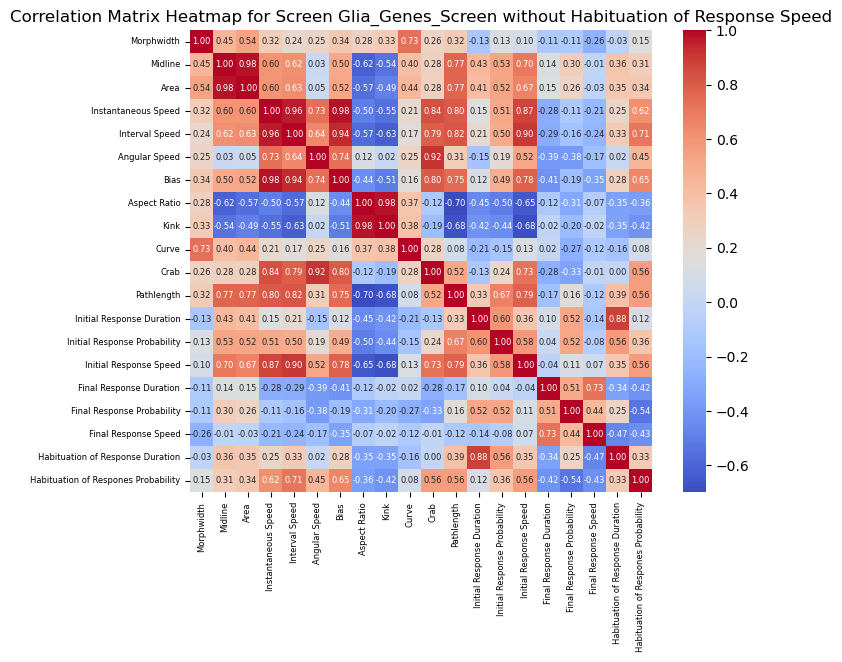

Features with correlation greater than 0.8 or less than -0.8 for Screen Glia_Genes_Screen
Area - Midline: 0.9788856350242257
Interval Speed - Instantaneous Speed: 0.9624148813893294
Bias - Instantaneous Speed: 0.9765902088983791
Bias - Interval Speed: 0.9355889948155837
Kink - Aspect Ratio: 0.9796879871644052
Crab - Instantaneous Speed: 0.8386216979020015
Crab - Angular Speed: 0.920156089972749
Crab - Bias: 0.8024762115523111
Pathlength - Instantaneous Speed: 0.8026336833583733
Pathlength - Interval Speed: 0.8204596486327261
Initial Response Speed - Instantaneous Speed: 0.8686804138723507
Initial Response Speed - Interval Speed: 0.9043562362253458
Habituation of Response Duration - Initial Response Duration: 0.8823861155556614


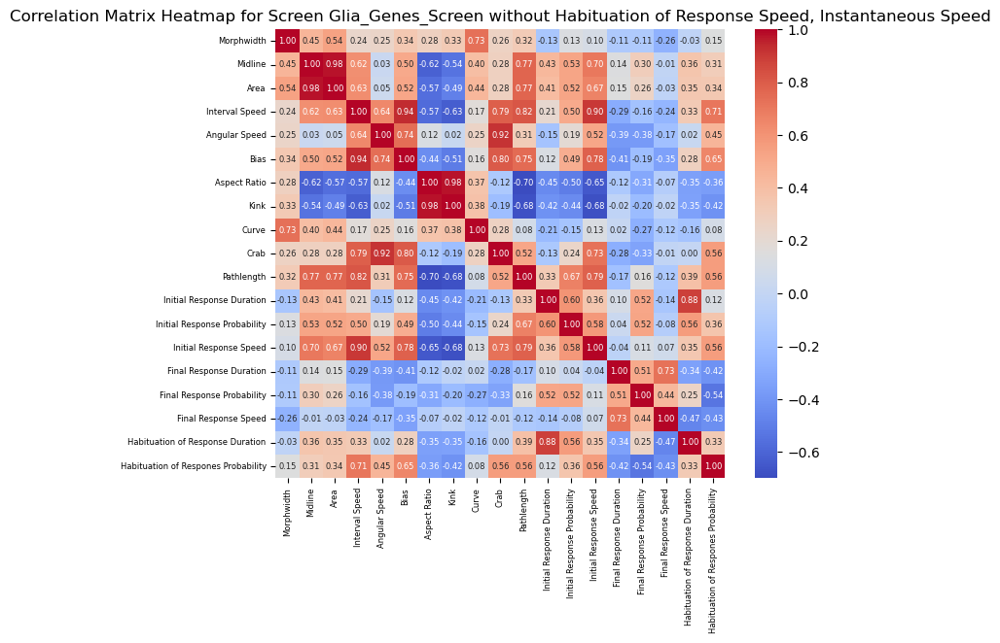

Features with correlation greater than 0.8 or less than -0.8 for Screen Glia_Genes_Screen
Area - Midline: 0.9788856350242257
Bias - Interval Speed: 0.9355889948155837
Kink - Aspect Ratio: 0.9796879871644052
Crab - Angular Speed: 0.920156089972749
Crab - Bias: 0.8024762115523111
Pathlength - Interval Speed: 0.8204596486327261
Initial Response Speed - Interval Speed: 0.9043562362253458
Habituation of Response Duration - Initial Response Duration: 0.8823861155556614


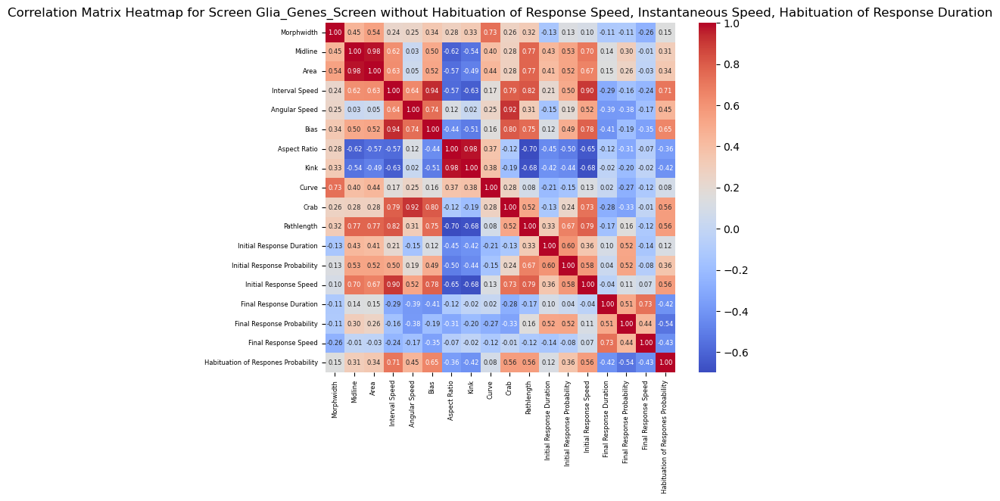

Features with correlation greater than 0.8 or less than -0.8 for Screen Glia_Genes_Screen
Area - Midline: 0.9788856350242257
Bias - Interval Speed: 0.9355889948155837
Kink - Aspect Ratio: 0.9796879871644052
Crab - Angular Speed: 0.920156089972749
Crab - Bias: 0.8024762115523111
Pathlength - Interval Speed: 0.8204596486327261
Initial Response Speed - Interval Speed: 0.9043562362253458


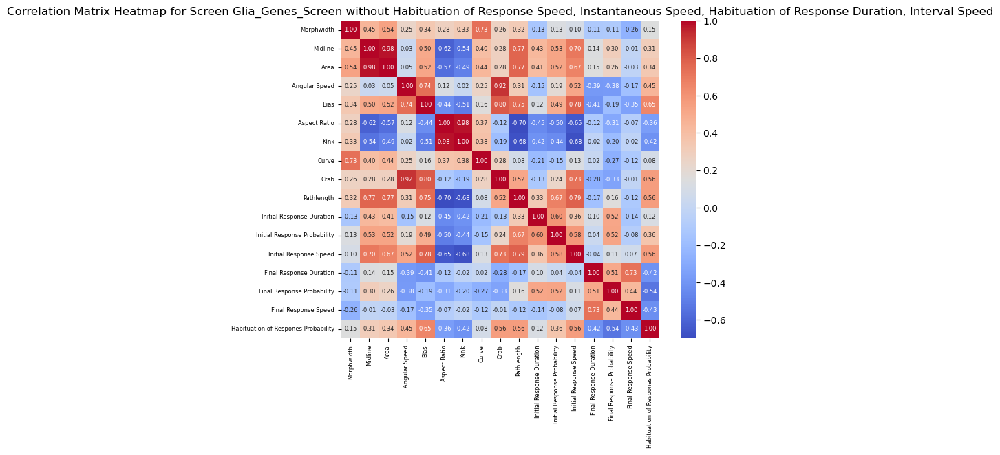

Features with correlation greater than 0.8 or less than -0.8 for Screen Glia_Genes_Screen
Area - Midline: 0.9788856350242257
Kink - Aspect Ratio: 0.9796879871644052
Crab - Angular Speed: 0.920156089972749
Crab - Bias: 0.8024762115523111


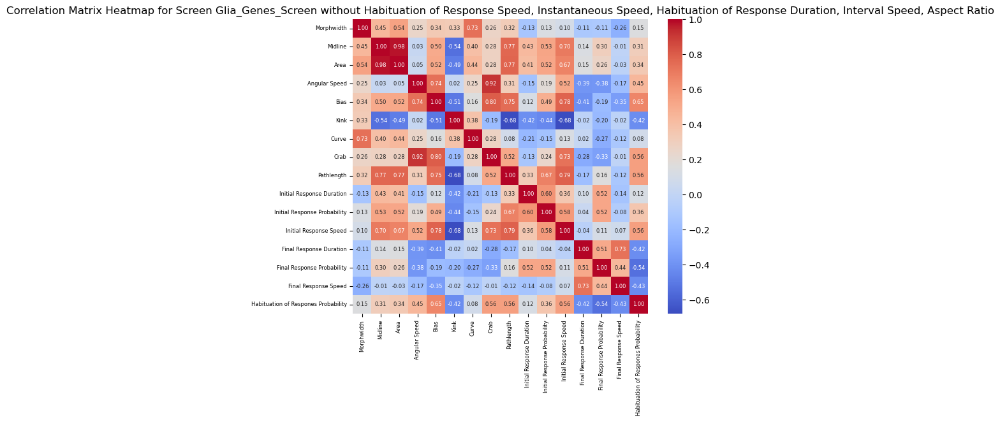

Features with correlation greater than 0.8 or less than -0.8 for Screen Glia_Genes_Screen
Area - Midline: 0.9788856350242257
Crab - Angular Speed: 0.920156089972749
Crab - Bias: 0.8024762115523111


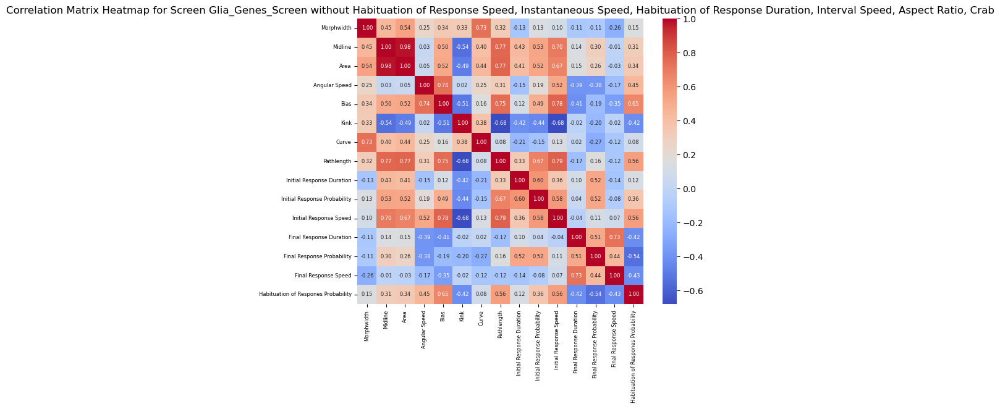

Features with correlation greater than 0.8 or less than -0.8 for Screen Glia_Genes_Screen
Area - Midline: 0.9788856350242257


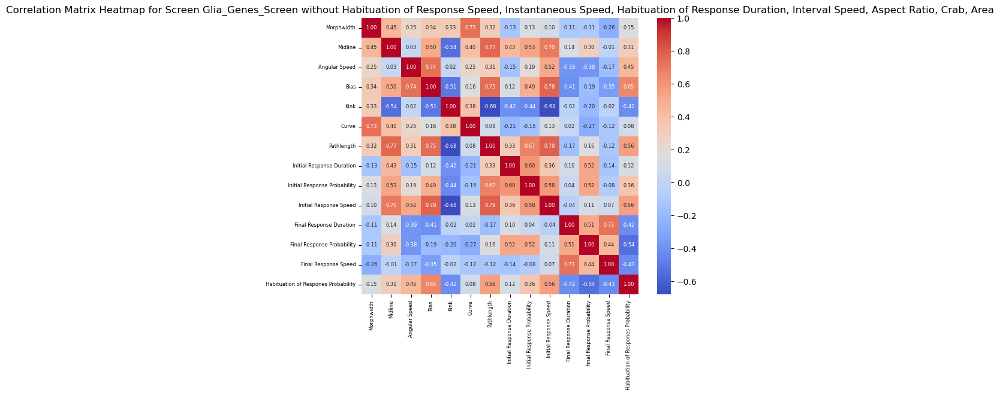

Features with correlation greater than 0.8 or less than -0.8 for Screen Glia_Genes_Screen


In [49]:
drop_columns_glia = []

for col in ['Habituation of Response Speed', 'Instantaneous Speed', 'Habituation of Response Duration','Interval Speed', 'Aspect Ratio', 'Crab','Area']:
    drop_columns_glia.append(col)

    # Calculate correlation matrix for this screen
    correlation_matrix = glia_data.drop(columns=['Gene', 'Screen']+drop_columns_glia).corr()

    # Plot heatmap for this screen
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True,annot_kws={'fontsize': 6})
    plt.title(f'Correlation Matrix Heatmap for Screen Glia_Genes_Screen without {", ".join(drop_columns_glia)}')    
    plt.xticks(fontsize=6)  # <--- Adjust font size here
    plt.yticks(fontsize=6)
    plt.show()

    # Print features with correlation greater than 0.8 or less than -0.8
    print('Features with correlation greater than 0.8 or less than -0.8 for Screen Glia_Genes_Screen')
    for i in range(len(correlation_matrix.columns)):
        for j in range(i):
            if abs(correlation_matrix.iloc[i, j]) > 0.8:
                print(f'{correlation_matrix.columns[i]} - {correlation_matrix.columns[j]}: {correlation_matrix.iloc[i, j]}')


### G-Proteins_Screen

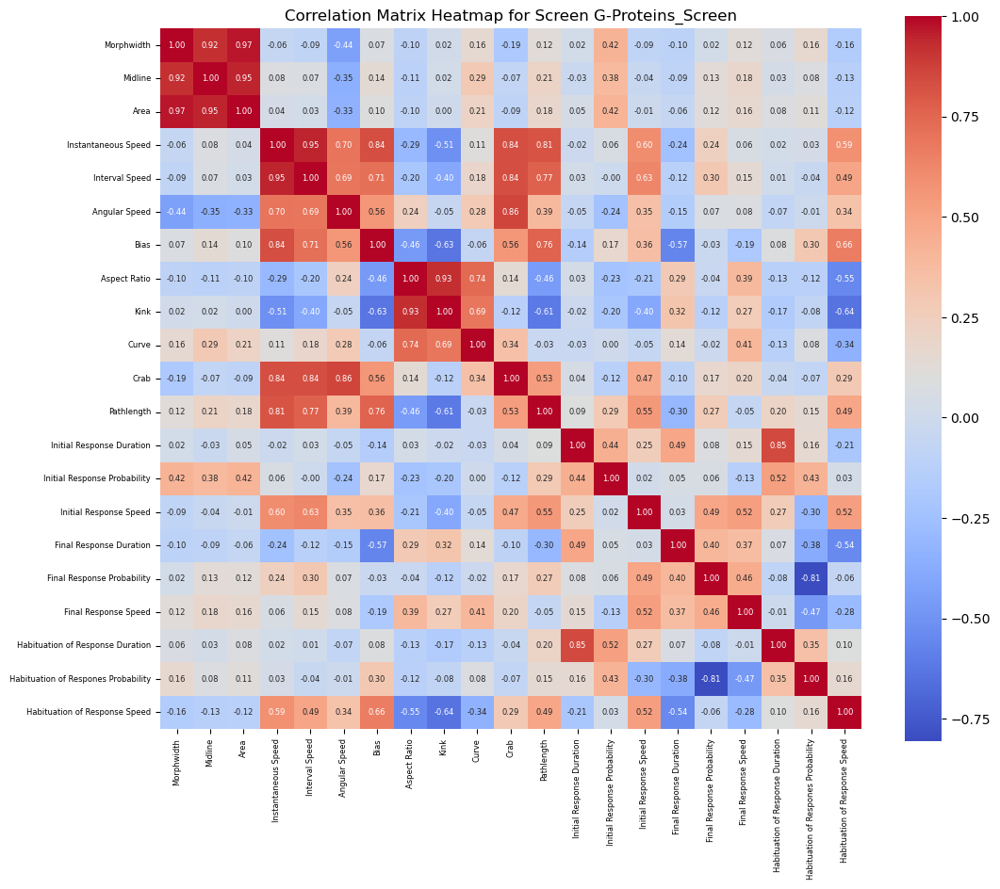

Features with correlation greater than 0.8 or less than -0.8 for Screen G-Proteins_Screen
Midline - Morphwidth: 0.9198328443765883
Area - Morphwidth: 0.9675581261369539
Area - Midline: 0.9453443461128047
Interval Speed - Instantaneous Speed: 0.9499637187658326
Bias - Instantaneous Speed: 0.8366398317248498
Kink - Aspect Ratio: 0.9251024554446751
Crab - Instantaneous Speed: 0.8361881146511818
Crab - Interval Speed: 0.8370004631212954
Crab - Angular Speed: 0.8637382401616188
Pathlength - Instantaneous Speed: 0.8146120463726642
Habituation of Response Duration - Initial Response Duration: 0.8500170433758902
Habituation of Respones Probability - Final Response Probability: -0.8065268310310713


In [50]:
gprot_data = data_na[data_na['Screen'] == 'G-Proteins_Screen']
    
# Calculate correlation matrix for this screen
correlation_matrix = gprot_data.drop(columns=['Gene', 'Screen']).corr()

# Plot heatmap for this screen
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, annot_kws={'fontsize': 6})
plt.title('Correlation Matrix Heatmap for Screen G-Proteins_Screen')
plt.xticks(fontsize=6)  # <--- Adjust font size here
plt.yticks(fontsize=6)
plt.show()

# Print features with correlation greater than 0.8 or less than -0.8
print('Features with correlation greater than 0.8 or less than -0.8 for Screen G-Proteins_Screen')
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            print(f'{correlation_matrix.columns[i]} - {correlation_matrix.columns[j]}: {correlation_matrix.iloc[i, j]}')

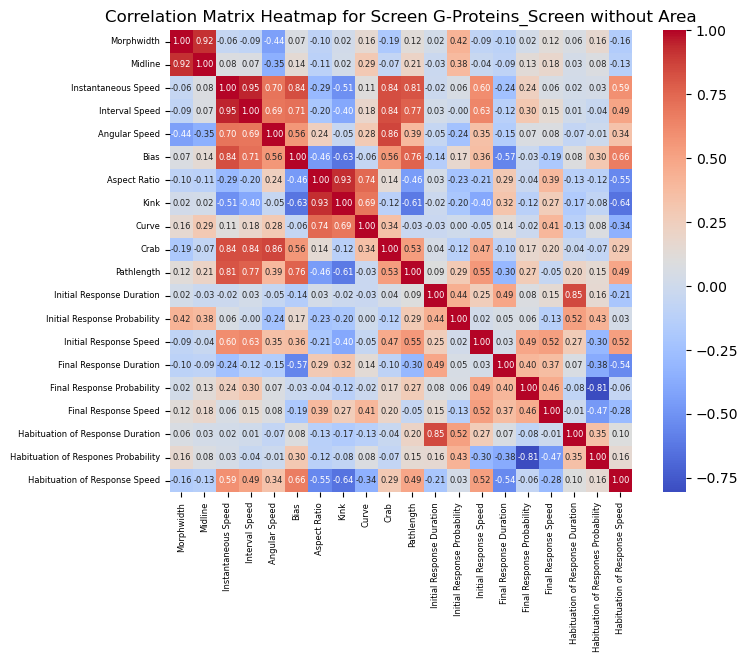

Features with correlation greater than 0.8 or less than -0.8 for Screen G-Proteins_Screen
Midline - Morphwidth: 0.9198328443765883
Interval Speed - Instantaneous Speed: 0.9499637187658326
Bias - Instantaneous Speed: 0.8366398317248498
Kink - Aspect Ratio: 0.9251024554446751
Crab - Instantaneous Speed: 0.8361881146511818
Crab - Interval Speed: 0.8370004631212954
Crab - Angular Speed: 0.8637382401616188
Pathlength - Instantaneous Speed: 0.8146120463726642
Habituation of Response Duration - Initial Response Duration: 0.8500170433758902
Habituation of Respones Probability - Final Response Probability: -0.8065268310310713


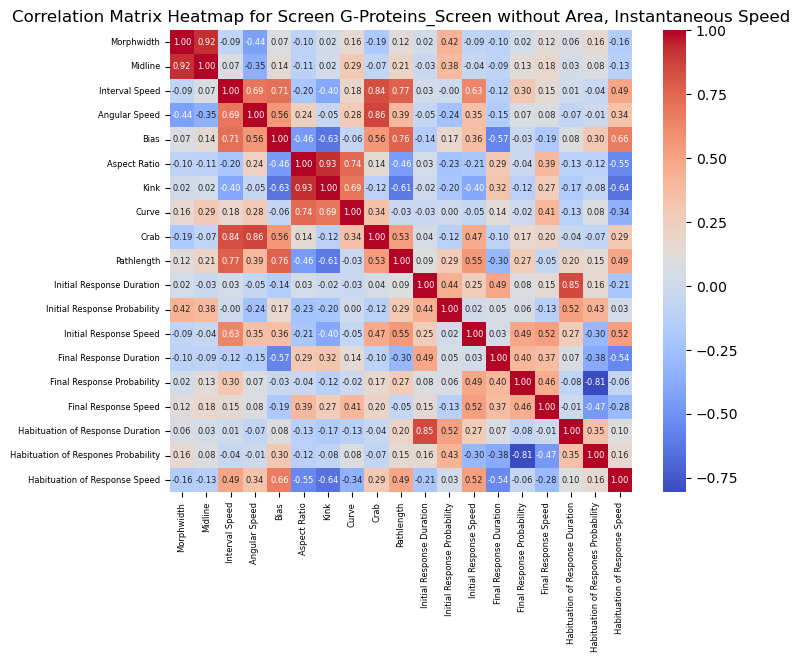

Features with correlation greater than 0.8 or less than -0.8 for Screen G-Proteins_Screen
Midline - Morphwidth: 0.9198328443765883
Kink - Aspect Ratio: 0.9251024554446751
Crab - Interval Speed: 0.8370004631212954
Crab - Angular Speed: 0.8637382401616188
Habituation of Response Duration - Initial Response Duration: 0.8500170433758902
Habituation of Respones Probability - Final Response Probability: -0.8065268310310713


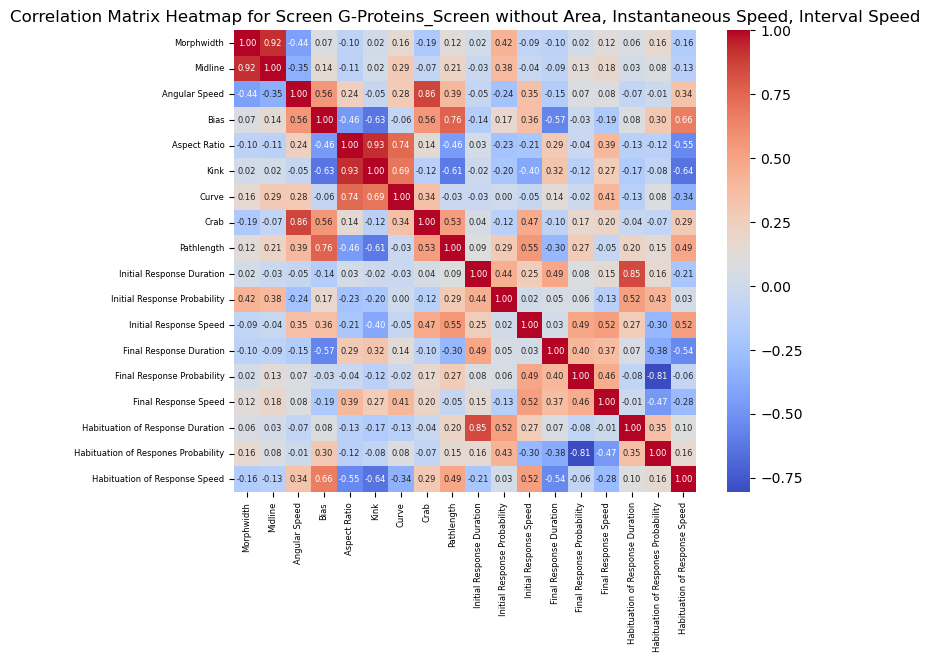

Features with correlation greater than 0.8 or less than -0.8 for Screen G-Proteins_Screen
Midline - Morphwidth: 0.9198328443765883
Kink - Aspect Ratio: 0.9251024554446751
Crab - Angular Speed: 0.8637382401616188
Habituation of Response Duration - Initial Response Duration: 0.8500170433758902
Habituation of Respones Probability - Final Response Probability: -0.8065268310310713


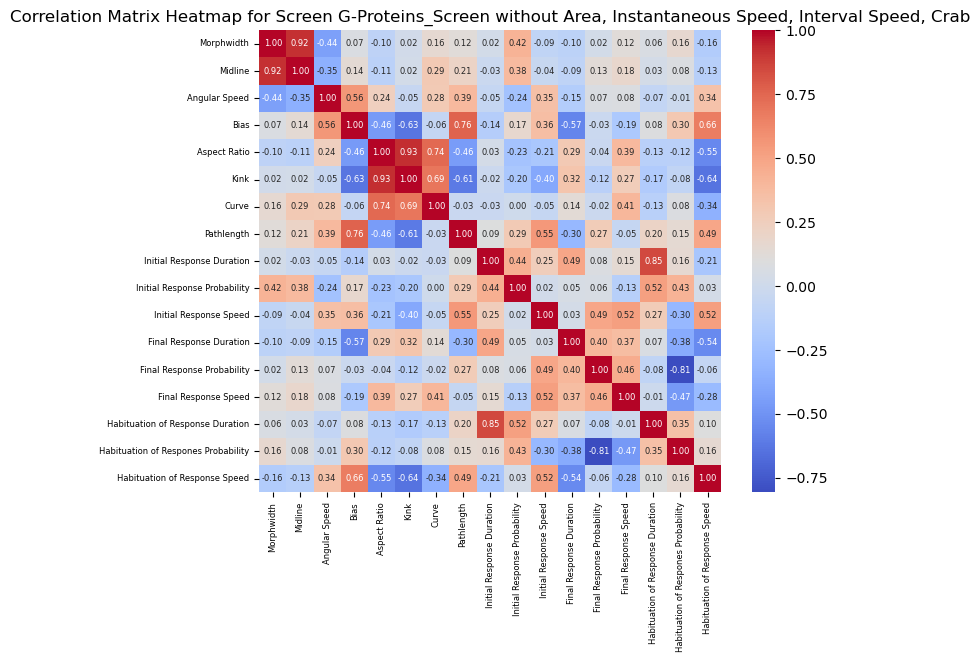

Features with correlation greater than 0.8 or less than -0.8 for Screen G-Proteins_Screen
Midline - Morphwidth: 0.9198328443765883
Kink - Aspect Ratio: 0.9251024554446751
Habituation of Response Duration - Initial Response Duration: 0.8500170433758902
Habituation of Respones Probability - Final Response Probability: -0.8065268310310713


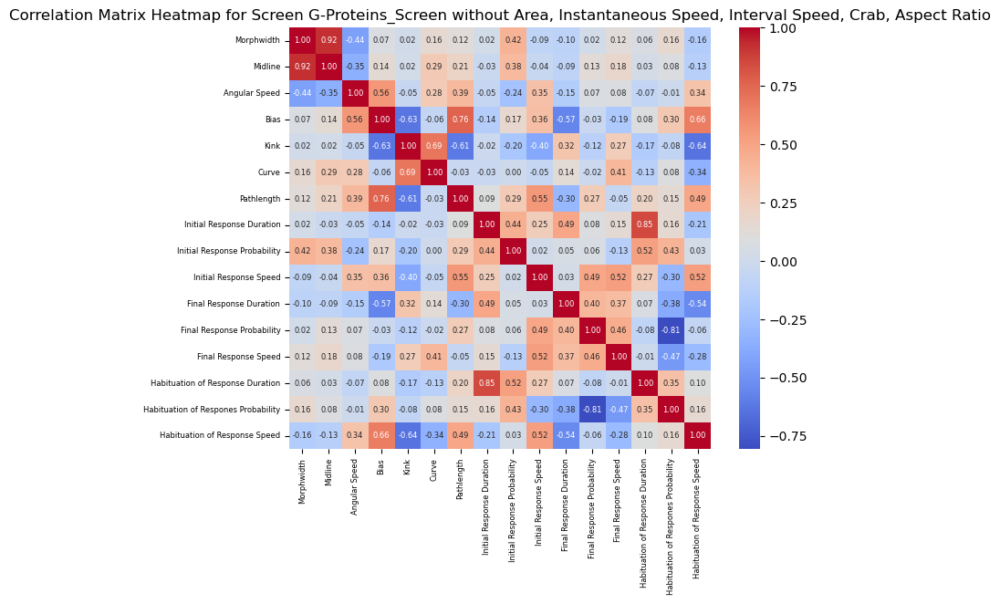

Features with correlation greater than 0.8 or less than -0.8 for Screen G-Proteins_Screen
Midline - Morphwidth: 0.9198328443765883
Habituation of Response Duration - Initial Response Duration: 0.8500170433758902
Habituation of Respones Probability - Final Response Probability: -0.8065268310310713


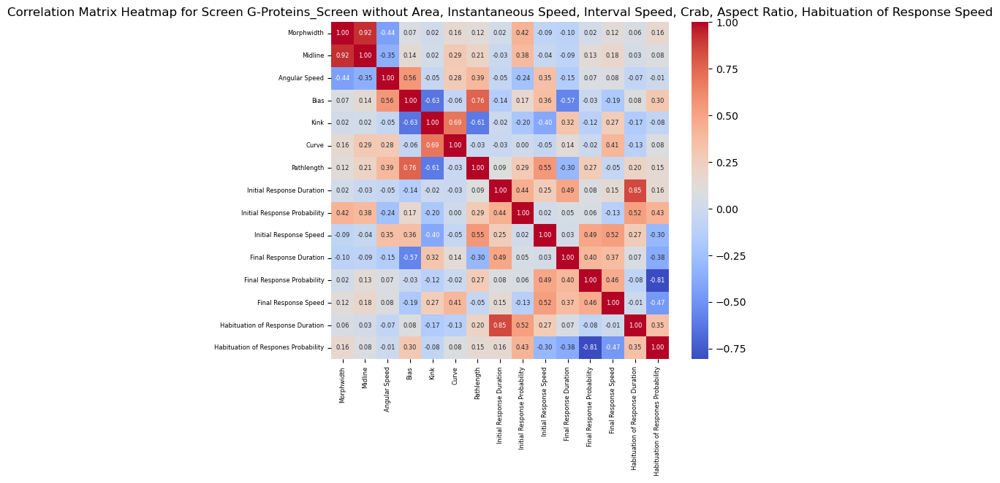

Features with correlation greater than 0.8 or less than -0.8 for Screen G-Proteins_Screen
Midline - Morphwidth: 0.9198328443765883
Habituation of Response Duration - Initial Response Duration: 0.8500170433758902
Habituation of Respones Probability - Final Response Probability: -0.8065268310310713


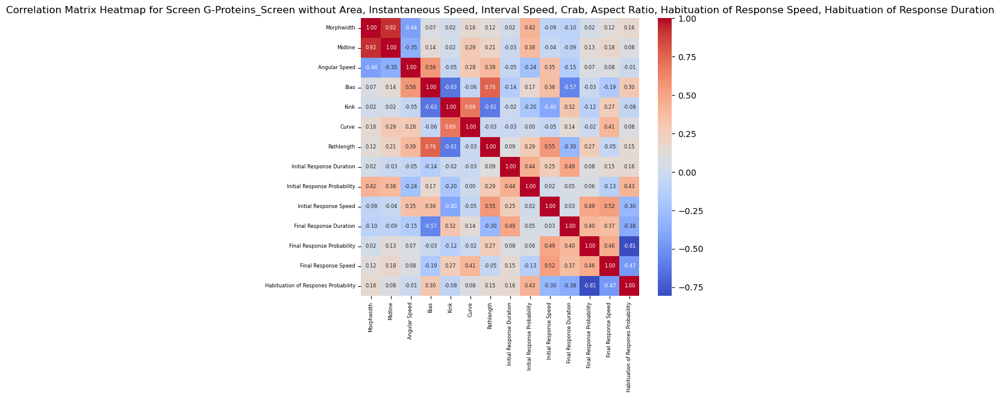

Features with correlation greater than 0.8 or less than -0.8 for Screen G-Proteins_Screen
Midline - Morphwidth: 0.9198328443765883
Habituation of Respones Probability - Final Response Probability: -0.8065268310310713


In [51]:
drop_columns_gprot = []

for col in ['Area', 'Instantaneous Speed','Interval Speed','Crab','Aspect Ratio','Habituation of Response Speed','Habituation of Response Duration']:
    drop_columns_gprot.append(col)

    # Calculate correlation matrix for this screen
    correlation_matrix = gprot_data.drop(columns=['Gene', 'Screen']+drop_columns_gprot).corr()

    # Plot heatmap for this screen
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True,annot_kws={'fontsize': 6})
    plt.title(f'Correlation Matrix Heatmap for Screen G-Proteins_Screen without {", ".join(drop_columns_gprot)}')    
    plt.xticks(fontsize=6)  # <--- Adjust font size here
    plt.yticks(fontsize=6)
    plt.show()

    # Print features with correlation greater than 0.8 or less than -0.8
    print('Features with correlation greater than 0.8 or less than -0.8 for Screen G-Proteins_Screen')
    for i in range(len(correlation_matrix.columns)):
        for j in range(i):
            if abs(correlation_matrix.iloc[i, j]) > 0.8:
                print(f'{correlation_matrix.columns[i]} - {correlation_matrix.columns[j]}: {correlation_matrix.iloc[i, j]}')


### Neuron Genes_Screen

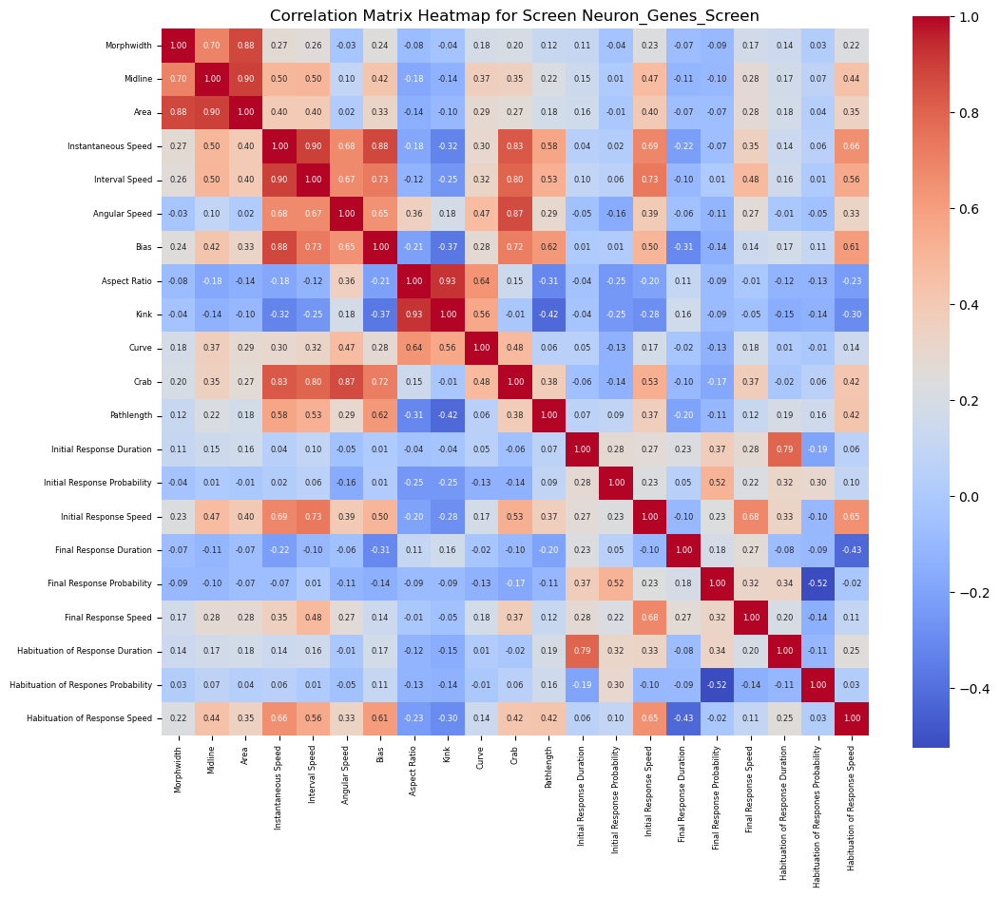

Features with correlation greater than 0.8 or less than -0.8 for Screen Neuron_Genes_Screen
Area - Morphwidth: 0.8804632424666429
Area - Midline: 0.8967761768916672
Interval Speed - Instantaneous Speed: 0.8978193517146354
Bias - Instantaneous Speed: 0.8765036434581407
Kink - Aspect Ratio: 0.9284570225937753
Crab - Instantaneous Speed: 0.8285996349494197
Crab - Angular Speed: 0.8682641075948154


In [52]:
neur_data = data_na[data_na['Screen'] == 'Neuron_Genes_Screen']
    
# Calculate correlation matrix for this screen
correlation_matrix = neur_data.drop(columns=['Gene', 'Screen']).corr()

# Plot heatmap for this screen
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, annot_kws={'fontsize': 6})
plt.title('Correlation Matrix Heatmap for Screen Neuron_Genes_Screen')
plt.xticks(fontsize=6)  # <--- Adjust font size here
plt.yticks(fontsize=6)
plt.show()

# Print features with correlation greater than 0.8 or less than -0.8
print('Features with correlation greater than 0.8 or less than -0.8 for Screen Neuron_Genes_Screen')
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            print(f'{correlation_matrix.columns[i]} - {correlation_matrix.columns[j]}: {correlation_matrix.iloc[i, j]}')

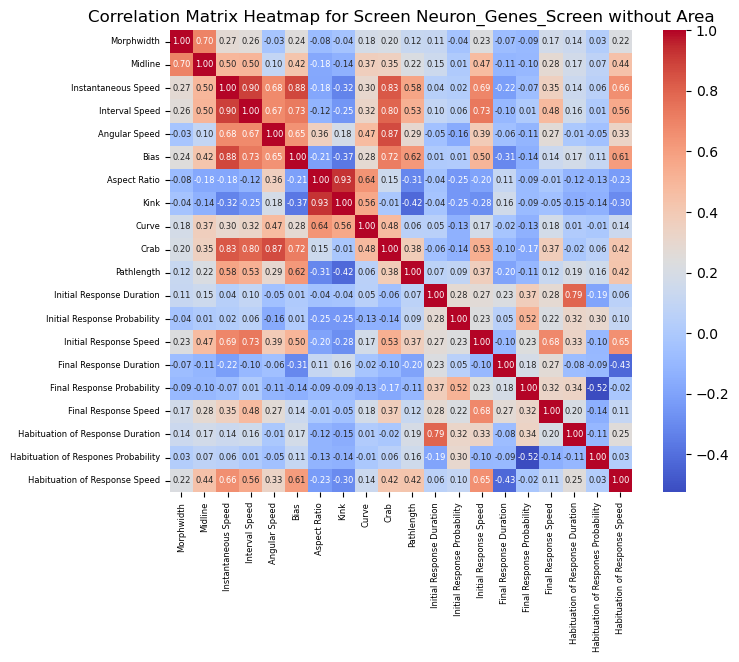

Features with correlation greater than 0.8 or less than -0.8 for Screen Neuron_Genes_Screen
Interval Speed - Instantaneous Speed: 0.8978193517146354
Bias - Instantaneous Speed: 0.8765036434581407
Kink - Aspect Ratio: 0.9284570225937753
Crab - Instantaneous Speed: 0.8285996349494197
Crab - Angular Speed: 0.8682641075948154


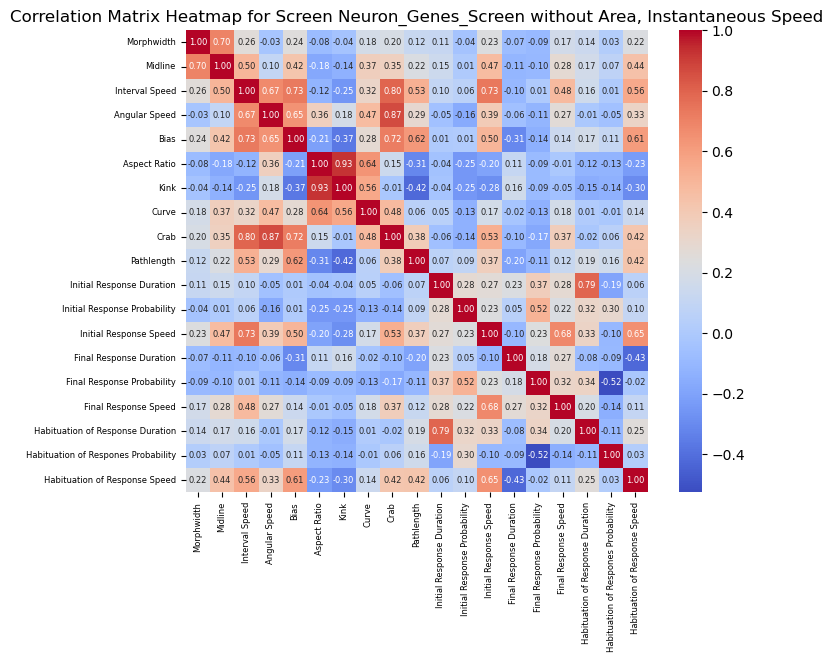

Features with correlation greater than 0.8 or less than -0.8 for Screen Neuron_Genes_Screen
Kink - Aspect Ratio: 0.9284570225937753
Crab - Angular Speed: 0.8682641075948154


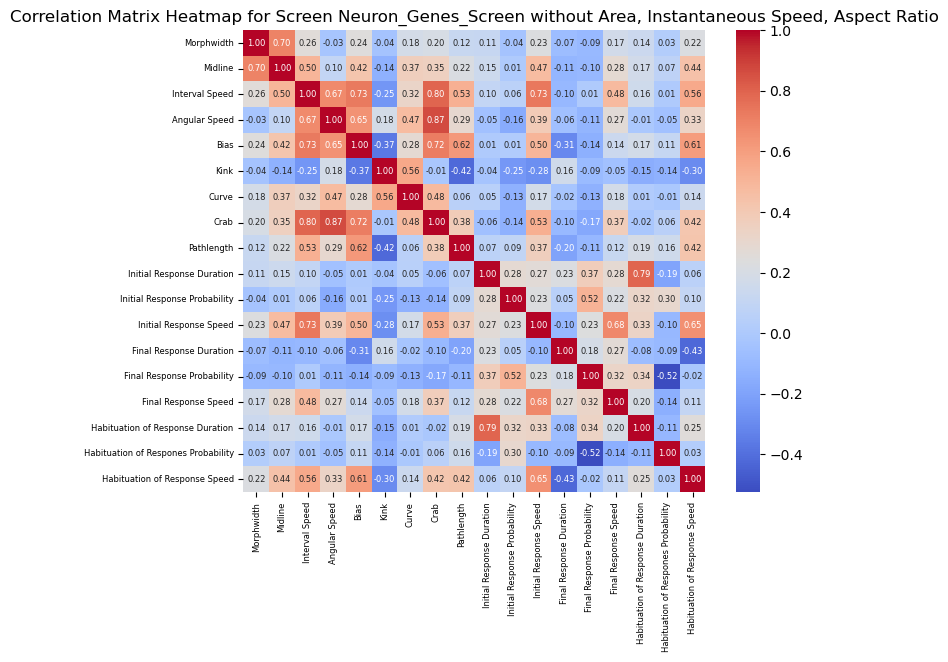

Features with correlation greater than 0.8 or less than -0.8 for Screen Neuron_Genes_Screen
Crab - Angular Speed: 0.8682641075948154


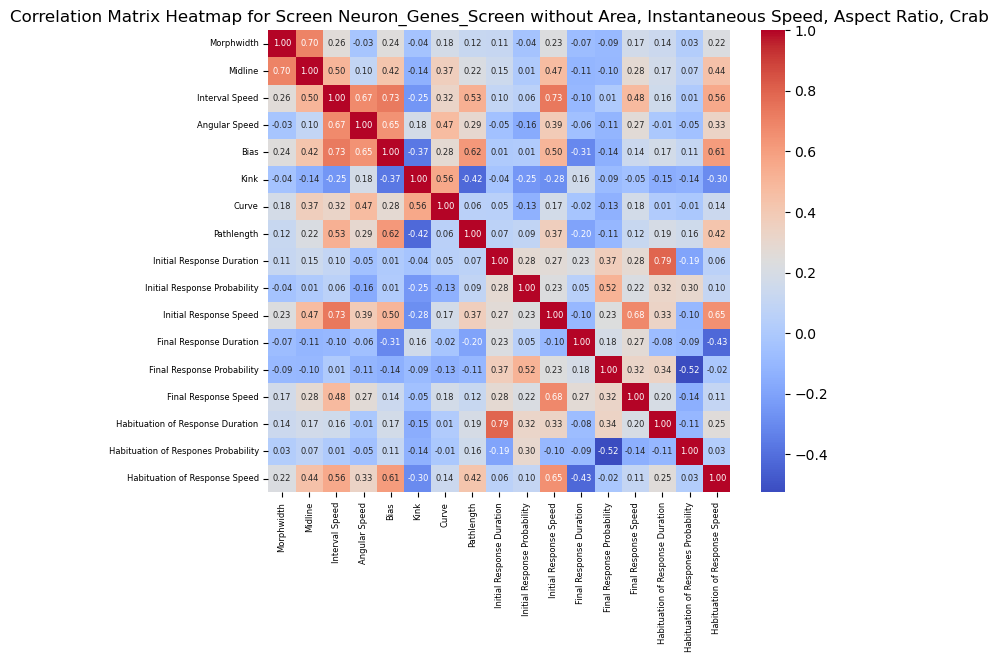

Features with correlation greater than 0.8 or less than -0.8 for Screen Neuron_Genes_Screen


In [53]:
drop_columns_neur = []

for col in ['Area', 'Instantaneous Speed','Aspect Ratio', 'Crab']:
    drop_columns_neur.append(col)

    # Calculate correlation matrix for this screen
    correlation_matrix = neur_data.drop(columns=['Gene', 'Screen']+drop_columns_neur).corr()

    # Plot heatmap for this screen
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True,annot_kws={'fontsize': 6})
    plt.title(f'Correlation Matrix Heatmap for Screen Neuron_Genes_Screen without {", ".join(drop_columns_neur)}')    
    plt.xticks(fontsize=6)  # <--- Adjust font size here
    plt.yticks(fontsize=6)
    plt.show()

    # Print features with correlation greater than 0.8 or less than -0.8
    print('Features with correlation greater than 0.8 or less than -0.8 for Screen Neuron_Genes_Screen')
    for i in range(len(correlation_matrix.columns)):
        for j in range(i):
            if abs(correlation_matrix.iloc[i, j]) > 0.8:
                print(f'{correlation_matrix.columns[i]} - {correlation_matrix.columns[j]}: {correlation_matrix.iloc[i, j]}')


#### Variance Inflation Factor (VIF)
### Entire dataset

In [54]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Adding a constant column for VIF calculation
drop_columns=['Instantaneous Speed','Area','Aspect Ratio', 'Habituation of Response Duration']
# X = data_na.drop(columns=['Gene', 'Screen']) ## all features included
X = data_na.drop(columns=['Gene', 'Screen']+ drop_columns) 
X = add_constant(X)

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF
vif_data = vif_data.drop(index=0)  # Drop the VIF for the constant
print(vif_data)


                                feature       VIF
1                            Morphwidth  2.205472
2                               Midline  3.317767
3                        Interval Speed  7.058927
4                         Angular Speed  9.528178
5                                  Bias  8.504174
6                                  Kink  6.399469
7                                 Curve  3.695472
8                                  Crab  8.046106
9                            Pathlength  2.186980
10            Initial Response Duration  1.531484
11         Initial Response Probability  4.637441
12               Initial Response Speed  6.536739
13              Final Response Duration  1.749252
14           Final Response Probability  5.058272
15                 Final Response Speed  3.601984
16  Habituation of Respones Probability  4.077900
17        Habituation of Response Speed  3.968866


A VIF above 10 indicates potential multicollinearity. We might remove or combine features with high vif's

we notice:
- Area : 15.250777
- Instantaneous Speed : 24.848813
- Interval Speed : 10.153316
- Angular Speed : 10.575539
- Bias : 13.646701
- Aspect Ratio : 20.083299
- Kink : 17.357243

after removing Area, Instantaneous Speed, Initial Response Duration, Crab and Angular Speed we got values of vif<10 however inthe correlation plot we saw that crab was highly correlated with multiple values so also decided to remove that which further reduced the vif values.

## VIF Screen Specific

### PD Screen

In [55]:
X = PD_data.drop(columns=['Gene', 'Screen']+ drop_columns) 
X = add_constant(X)
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF
vif_data = vif_data.drop(index=0)  # Drop the VIF for the constant
print(vif_data)

                                feature        VIF
1                            Morphwidth   2.728464
2                               Midline   3.306986
3                        Interval Speed  10.737882
4                         Angular Speed  12.858230
5                                  Bias   6.488444
6                                  Kink   8.505489
7                                 Curve   8.470920
8                                  Crab  11.476723
9                            Pathlength   2.344111
10            Initial Response Duration   1.542197
11         Initial Response Probability   9.884033
12               Initial Response Speed   7.163469
13              Final Response Duration   2.028496
14           Final Response Probability   7.725382
15                 Final Response Speed   5.758003
16  Habituation of Respones Probability   8.036430
17        Habituation of Response Speed   4.160779


A VIF above 10 indicates potential multicollinearity. We might remove or combine features with high vif's

we notice:
- Interval Speed : 10.737882
- Angular Speed : 12.858230
- Crab : 11.476723


### ASD Screen

In [56]:
X = ASD_data.drop(columns=['Gene', 'Screen']+ drop_columns) 
X = add_constant(X)
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF
vif_data = vif_data.drop(index=0)  # Drop the VIF for the constant
print(vif_data)

                                feature        VIF
1                            Morphwidth   2.047291
2                               Midline   3.315628
3                        Interval Speed   8.879054
4                         Angular Speed   8.048039
5                                  Bias   6.580737
6                                  Kink   7.132415
7                                 Curve   4.305339
8                                  Crab   4.449778
9                            Pathlength   2.356061
10            Initial Response Duration   2.791110
11         Initial Response Probability  13.569045
12               Initial Response Speed  13.387363
13              Final Response Duration   2.015452
14           Final Response Probability   6.578732
15                 Final Response Speed   7.350498
16  Habituation of Respones Probability  10.988834
17        Habituation of Response Speed   6.560164


A VIF above 10 indicates potential multicollinearity. We might remove or combine features with high vif's

we notice:
- Initial Response Probability : 13.569045
- Initial Response Speed : 13.387363
- Habituation of Respones Probability : 10.988834


### Glia Genes Screen

In [57]:
X = glia_data.drop(columns=['Gene', 'Screen']+ drop_columns) 
X = add_constant(X)
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF
vif_data = vif_data.drop(index=0)  # Drop the VIF for the constant
print(vif_data)

                                feature          VIF
1                            Morphwidth   407.781255
2                               Midline   739.501614
3                        Interval Speed    92.633373
4                         Angular Speed   636.434673
5                                  Bias   655.677001
6                                  Kink  1154.982836
7                                 Curve   115.012129
8                                  Crab  1323.835242
9                            Pathlength    79.739260
10            Initial Response Duration   138.162958
11         Initial Response Probability   466.671609
12               Initial Response Speed   366.112404
13              Final Response Duration    13.174147
14           Final Response Probability   526.356352
15                 Final Response Speed   107.309129
16  Habituation of Respones Probability   756.951968
17        Habituation of Response Speed   816.939471


A VIF above 10 indicates potential multicollinearity. We might remove or combine features with high vif's

we notice:
- Initial Response Probability : 13.569045
- Initial Response Speed : 13.387363
- Habituation of Respones Probability : 10.988834


### G-proteins Screen

In [58]:
X = gprot_data.drop(columns=['Gene', 'Screen']+ drop_columns) 
X = add_constant(X)
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF
vif_data = vif_data.drop(index=0)  # Drop the VIF for the constant
print(vif_data)

                                feature        VIF
1                            Morphwidth  12.104146
2                               Midline  16.032053
3                        Interval Speed  14.250196
4                         Angular Speed  17.254828
5                                  Bias  13.373580
6                                  Kink  16.586241
7                                 Curve  10.655026
8                                  Crab  16.696972
9                            Pathlength  13.861037
10            Initial Response Duration   4.766955
11         Initial Response Probability   7.590583
12               Initial Response Speed  39.134813
13              Final Response Duration   4.347296
14           Final Response Probability  30.932588
15                 Final Response Speed  17.546887
16  Habituation of Respones Probability  31.742616
17        Habituation of Response Speed  23.211880


A VIF above 10 indicates potential multicollinearity. We might remove or combine features with high vif's

we notice:
- Initial Response Probability : 13.569045
- Initial Response Speed : 13.387363
- Habituation of Respones Probability : 10.988834


### Neuron Genes Screen

In [59]:
X = neur_data.drop(columns=['Gene', 'Screen']+ drop_columns) 
X = add_constant(X)
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF
vif_data = vif_data.drop(index=0)  # Drop the VIF for the constant
print(vif_data)

                                feature        VIF
1                            Morphwidth   2.382265
2                               Midline   3.869551
3                        Interval Speed   5.968852
4                         Angular Speed  10.093290
5                                  Bias   6.501270
6                                  Kink   4.924653
7                                 Curve   3.452913
8                                  Crab   8.663918
9                            Pathlength   1.999322
10            Initial Response Duration   1.390668
11         Initial Response Probability   3.953562
12               Initial Response Speed   6.350380
13              Final Response Duration   1.532730
14           Final Response Probability   4.797707
15                 Final Response Speed   3.381154
16  Habituation of Respones Probability   3.854738
17        Habituation of Response Speed   3.365469


A VIF above 10 indicates potential multicollinearity. We might remove or combine features with high vif's

we notice:
- Angular Speed : 10.093290


#### Area Under the Curve (AUC): evaluate a preliminary classification model

AUC Score for : 0.7533


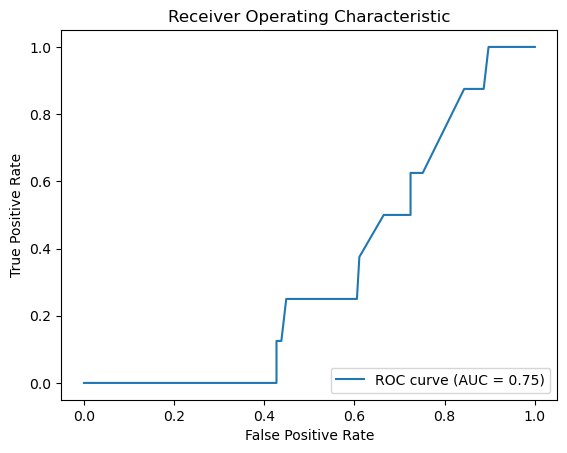

ValueError: Only one class present in y_true. ROC AUC score is not defined in that case.

In [75]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# List of datasets
datasets = [data_na, PD_data, ASD_data, neur_data, gprot_data, glia_data]

# List to store AUC scores
auc_scores = []

# Loop through each dataset
for data in datasets:
    # Splitting data into training and test sets
    X = data.drop(columns=['Gene', 'Screen']+drop_columns)
    y = data['Screen']

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=43)

    # Training a Random Forest Classifier
    model = RandomForestClassifier(random_state=43)
    model.fit(X_train, y_train)

    # Predict probabilities
    y_prob = model.predict_proba(X_test)

    # Calculate AUC
    auc_score = roc_auc_score(y_test, y_prob, multi_class='ovr')
    auc_scores.append(auc_score)
    print(f"AUC Score for : {auc_score:.4f}")

    # Plot ROC Curve (example for one class)
    fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1], pos_label=model.classes_[1])
    plt.figure()
    plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc_score:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

print("AUC scores for all datasets:", auc_scores)

AUC Score: 0.7671


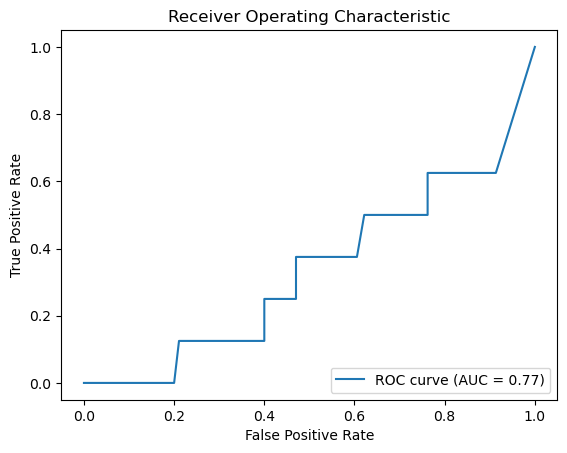

In [60]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, roc_curve

# Splitting data into training and test sets
# X = data_na.drop(columns=['Gene', 'Screen']) # all features included
X = data_na.drop(columns=['Gene', 'Screen']+drop_columns)
y = data_na['Screen']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=43)

# Training a Random Forest Classifier
model = RandomForestClassifier(random_state=43)
model.fit(X_train, y_train)

# Predict probabilities
y_prob = model.predict_proba(X_test)

# Calculate AUC
auc_score = roc_auc_score(y_test, y_prob, multi_class='ovr')
print(f"AUC Score: {auc_score:.4f}")

# Plot ROC Curve (example for one class)
fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1], pos_label=model.classes_[1])
plt.figure()
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc_score:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


Interpretation:

- AUC = 1: Perfect model, AUC = 0.5: Model performs no better than random guessing, AUC < 0.5: Model is worse than random guessing.
We have AUC=0.78
- the curve has flat regions, it means the model is encountering a range of threshold values where increasing the threshold doesn’t improve the true positive rate but does increase the false positive rate.

## Clustering

### One-vs-Rest Classification:

Treat one screen as the positive class (in-group) and all others as the negative class (out-group). This is a common approach for multi-class classification problems

In [61]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression

# Using Logistic Regression with One-vs-Rest strategy
X = data_na.drop(columns=['Gene', 'Screen']+drop_columns)
y = data_na['Screen']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=43)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = OneVsRestClassifier(LogisticRegression(random_state=42))
model.fit(X_train_scaled, y_train)

# Predict and evaluate
y_pred = model.predict(X_test_scaled)



In [62]:
drop_columns=['Instantaneous Speed','Area','Aspect Ratio', 'Initial Response Duration','Crab']
X = data_na.drop(columns=['Gene', 'Screen']+drop_columns)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=43)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [63]:
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score, classification_report

ovr = OneVsRestClassifier(LogisticRegression(random_state=43, max_iter=1000))
ovr.fit(X_train_scaled, y_train)

y_pred_ovr = ovr.predict(X_test_scaled)
y_proba_ovr = ovr.predict_proba(X_test_scaled)[:, 1]

print(classification_report(y_test, y_pred_ovr))
score = ovr.score(X_test_scaled, y_test)
print(score)

for i, screen in enumerate(ovr.classes_):
    print(f"Screen: {screen}")
    print(pd.DataFrame({
        'Feature': X.columns,
        'Coefficient': ovr.estimators_[i].coef_.flatten()
    }).sort_values(by='Coefficient', ascending=False))
    print("\n")


                     precision    recall  f1-score   support

         ASD_Screen       0.77      0.36      0.49        28
  G-Proteins_Screen       0.00      0.00      0.00         8
  Glia_Genes_Screen       0.17      1.00      0.29         1
Neuron_Genes_Screen       0.84      0.94      0.89       125
          PD_Screen       0.62      0.68      0.65        31

           accuracy                           0.78       193
          macro avg       0.48      0.60      0.46       193
       weighted avg       0.76      0.78      0.75       193

0.7772020725388601
Screen: ASD_Screen
                                Feature  Coefficient
4                                  Bias     1.440606
14  Habituation of Respones Probability     0.572578
0                            Morphwidth     0.539215
12                 Final Response Speed     0.360884
9                Initial Response Speed     0.341515
1                               Midline     0.305067
7                            Pathlength

/Users/lavanya/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lavanya/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lavanya/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


feature importance tells you which features are most important for distinguishing each class from the others

we notice the features involving response probability are common between all a lot of screens, and has high coefficients in absolute value 

### Random forest

In [64]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_scaled, y_train)

# Predictions and Evaluation
y_pred_rf = rf.predict(X_test_scaled)
y_proba_rf = rf.predict_proba(X_test_scaled)[:, 1]
print(y_proba_rf.shape)

print("Random Forest Classification Report:\n", classification_report(y_test, y_pred_rf))


(193,)
Random Forest Classification Report:
                      precision    recall  f1-score   support

         ASD_Screen       0.56      0.32      0.41        28
  G-Proteins_Screen       0.00      0.00      0.00         8
  Glia_Genes_Screen       0.00      0.00      0.00         1
Neuron_Genes_Screen       0.83      0.85      0.84       125
          PD_Screen       0.57      0.68      0.62        31

           accuracy                           0.70       193
          macro avg       0.39      0.37      0.37       193
       weighted avg       0.71      0.70      0.70       193



### GBM

In [65]:
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier

le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

xgb = XGBClassifier(n_estimators=100, random_state=42,  eval_metric='logloss')
xgb.fit(X_train_scaled, y_train_encoded)

y_pred_xgb = xgb.predict(X_test_scaled)

# Calculate accuracy for each screen
screens = le.classes_
for i, screen in enumerate(screens):
    y_test_screen = (y_test == screen).astype(int)
    y_pred_screen = (y_pred_xgb == i).astype(int)
    accuracy = accuracy_score(y_test_screen, y_pred_screen)
    print(f"Accuracy for {screen}: {accuracy:.3f}")

# Calculate classification report
print("XGBoost Classification Report:\n", classification_report(y_test, le.inverse_transform(y_pred_xgb)))

# Calculate AUC for each screen (if applicable)
if len(screens) > 2:
    y_pred_proba_xgb = xgb.predict_proba(X_test_scaled)
    for i, screen in enumerate(screens):
        y_test_screen = (y_test == screen).astype(int)
        y_pred_proba_screen = y_pred_proba_xgb[:, i]
        auc = roc_auc_score(y_test_screen, y_pred_proba_screen)
        print(f"AUC for {screen}: {auc:.3f}")

Accuracy for ASD_Screen: 0.839
Accuracy for G-Proteins_Screen: 0.922
Accuracy for Glia_Genes_Screen: 0.974
Accuracy for Neuron_Genes_Screen: 0.788
Accuracy for PD_Screen: 0.845
XGBoost Classification Report:
                      precision    recall  f1-score   support

         ASD_Screen       0.42      0.29      0.34        28
  G-Proteins_Screen       0.00      0.00      0.00         8
  Glia_Genes_Screen       0.00      0.00      0.00         1
Neuron_Genes_Screen       0.83      0.85      0.84       125
          PD_Screen       0.51      0.58      0.55        31

           accuracy                           0.68       193
          macro avg       0.35      0.34      0.34       193
       weighted avg       0.68      0.68      0.68       193

AUC for ASD_Screen: 0.813
AUC for G-Proteins_Screen: 0.564
AUC for Glia_Genes_Screen: 0.969
AUC for Neuron_Genes_Screen: 0.862
AUC for PD_Screen: 0.882


In [66]:
import warnings
warnings.filterwarnings("ignore")

In [67]:
from lightgbm import LGBMClassifier

# Initialize and train the model
lgbm = LGBMClassifier(n_estimators=100, random_state=42,force_col_wise=True,max_depth= 3, num_leaves= 31)
lgbm.fit(X_train_scaled, y_train_encoded)

# Predictions and Evaluation
y_pred_lgbm = lgbm.predict(X_test_scaled)
y_proba_lgbm = lgbm.predict_proba(X_test_scaled)[:, 1]

screens = le.classes_
for i, screen in enumerate(screens):
    y_test_screen = (y_test == screen).astype(int)
    y_pred_screen = (y_pred_lgbm == i).astype(int)
    accuracy = accuracy_score(y_test_screen, y_pred_screen)
    print(f"Accuracy for {screen}: {accuracy:.3f}")

# Calculate classification report
print("LightGBM Classification Report:\n", classification_report(y_test, le.inverse_transform(y_pred_lgbm)))

# Calculate AUC for each screen (if applicable)
if len(screens) > 2:
    y_pred_proba_lgbm = lgbm.predict_proba(X_test_scaled)
    for i, screen in enumerate(screens):
        y_test_screen = (y_test == screen).astype(int)
        y_pred_proba_screen = y_pred_proba_lgbm[:, i]
        auc = roc_auc_score(y_test_screen, y_pred_proba_screen)
        print(f"AUC for {screen}: {auc:.3f}")


[LightGBM] [Info] Total Bins 2403
[LightGBM] [Info] Number of data points in the train set: 450, number of used features: 16
[LightGBM] [Info] Start training from score -2.101914
[LightGBM] [Info] Start training from score -3.018205
[LightGBM] [Info] Start training from score -3.276034
[LightGBM] [Info] Start training from score -0.488847
[LightGBM] [Info] Start training from score -1.727221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

In [68]:
from sklearn.model_selection import GridSearchCV
from lightgbm import LGBMClassifier

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 10],
    'num_leaves': [31, 62, 127]
    # 'reg_alpha': [0, 0.1, 1],
    # 'reg_lambda': [0, 0.1, 1]
}

# Initialize the LightGBM model
lgbm = LGBMClassifier(random_state=42, force_col_wise=True)

# Perform Grid Search
grid_search = GridSearchCV(lgbm, param_grid, cv=5, scoring='f1_macro')
grid_search.fit(X_train_scaled, y_train_encoded)

# Print the best hyperparameters and the corresponding score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Train the model with the best hyperparameters
best_lgbm = grid_search.best_estimator_
best_lgbm.fit(X_train_scaled, y_train_encoded)

# Make predictions with the best model
y_pred_lgbm = best_lgbm.predict(X_test_scaled)
y_proba_lgbm = best_lgbm.predict_proba(X_test_scaled)[:, 1]

# Evaluate the model
screens = le.classes_
for i, screen in enumerate(screens):
    y_test_screen = (y_test == screen).astype(int)
    y_pred_screen = (y_pred_lgbm == i).astype(int)
    accuracy = accuracy_score(y_test_screen, y_pred_screen)
    print(f"Accuracy for {screen}: {accuracy:.3f}")

print("LightGBM Classification Report:\n", classification_report(y_test, le.inverse_transform(y_pred_lgbm)))

if len(screens) > 2:
    y_pred_proba_lgbm = best_lgbm.predict_proba(X_test_scaled)
    for i, screen in enumerate(screens):
        y_test_screen = (y_test == screen).astype(int)
        y_pred_proba_screen = y_pred_proba_lgbm[:, i]
        auc = roc_auc_score(y_test_screen, y_pred_proba_screen)
        print(f"AUC for {screen}: {auc:.3f}")

[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 360, number of used features: 16
[LightGBM] [Info] Start training from score -2.101914
[LightGBM] [Info] Start training from score -2.995732
[LightGBM] [Info] Start training from score -3.247047
[LightGBM] [Info] Start training from score -0.492476
[LightGBM] [Info] Start training from score -1.727221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

Exception ignored on calling ctypes callback function: <function _log_callback at 0x16bb34040>
Traceback (most recent call last):
  File "/Users/lavanya/anaconda3/lib/python3.11/site-packages/lightgbm/basic.py", line 203, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

#### CV

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {cv_scores}")
print(f"Average cross-validation score: {cv_scores.mean()}")

#### Model eval

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

y_pred = model.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5, random_state=42)  # Adjust the number of clusters as needed
data_na['Cluster'] = kmeans.fit_predict(data_na[features])

In [ ]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust parameters as needed
data_na['DBSCAN'] = dbscan.fit_predict(data_na[features])

In [ ]:
data_na

### Feature importance

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(data_na[features], data_na['Cluster'])

feature_importances = pd.Series(rf.feature_importances_, index=features).sort_values(ascending=False)
print(feature_importances)

### Visualisation

In [ ]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

silhouette_avg = silhouette_score(data_na[features], data_na['DBSCAN'])
db_score = davies_bouldin_score(data_na[features], data_na['DBSCAN'])

print(f"Silhouette Score: {silhouette_avg}")
print(f"Davies-Bouldin Index: {db_score}")

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(data_na[features][:, 0], data_na[features][:, 1], c=data_na['DBSCAN'], cmap='viridis')
plt.title('Clustering Results')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
pca_components = pca.fit_transform(data_na[features])

plt.scatter(pca_components[:, 0], pca_components[:, 1], c=data_na['Cluster'], cmap='viridis')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Gene Clusters')
plt.show()

In [ ]:
screen_cluster_distribution = data_na.groupby(['Cluster', 'Screen']).size().unstack(fill_value=0)
screen_cluster_distribution